In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import explanation_soccer_analysis
from sklearn import preprocessing
from sklearn.preprocessing import RobustScaler
import matplotlib.patches as patches
import matplotlib.patheffects as pe
from matplotlib.lines import Line2D
from scipy.stats import variation
import shap
import os

Using TensorFlow backend.


In [2]:
notebook_path = os.path.abspath("model_training_and_predictions_explanation.ipynb")
IMG_DATAPATH = os.path.join(os.path.dirname(notebook_path), "img")

In [3]:
df1718 = pd.read_csv('for_the_model.csv')
df1617 = pd.read_csv('for_the_model_2016_2017.csv')
df1819 = pd.read_csv('for_the_model_2018_2019.csv')
dfmatc = pd.read_json(r'C:\Users\matte\Data Science\Tesi\InputDataset\2018-2019\matches_2018-2019.json', encoding = "unicode-escape")
dfmatc = dfmatc.reindex(sorted(dfmatc.columns), axis=1)

frames = [df1617, df1718, df1819]
print(len(df1819))

alle = pd.concat(frames)
allec = alle[alle['player_role_fantacalcio'] == 'C']
allea = alle[alle['player_role_fantacalcio'] == 'A']
alled = alle[alle['player_role_fantacalcio'] == 'D']
allep = alle[alle['player_role_fantacalcio'] == 'P']

# 2759775 2759604 2759546 2759711 2759678 2759621 2759574 2759498 2759709 2759803
list_games_to_watch = [2759775, 2759604, 2759546, 2759711, 2759678, 2759621, 2759574, 2759498, 2759709, 2759803]
TEST_SET = df1819[df1819['match_id'].isin(list_games_to_watch)]

print(len(TEST_SET))

df1819 = df1819[~df1819['match_id'].isin(list_games_to_watch)]

print(len(df1819))
frames = [df1617, df1718, df1819]

df = pd.concat(frames)
print(len(df))
df.rename(columns={'contextual_expecatition':'contextual_expectation'}, inplace=True)
TEST_SET.rename(columns={'contextual_expecatition':'contextual_expectation'}, inplace=True)

8907
243
8664
25272


In [4]:
listMarks = ['fantacalcio_score']
listRoles = ['C', 'A', 'D', 'P']
toRemoveRatings = ['ratings', 'ratings_3', 'ratings_5', 'ratings_7', 'ratings_9', 'ratings_total_alpha']
toRemoveWithoutContextual = ['big_match', 'winner', 'contextual_h/a', 'contextual_team_goal', 'contextual_goal_suffered', 
                            'contextual_goal_difference', 'contextual_club_name', 'contextual_against_club_name', 'contextual_age',
                            'contextual_expecatition']
toRemove = ['match_id', 'match_day', 'team_id', 'player_name_fantacalcio', 'player_role_fantacalcio',
           'player_role_newspaper', 'player_name_newspaper', 'corriere_score', 'tuttosport_score', 'fantacalcio_score','gazzetta_score', 'team',
           'match_day_newspaper', 'match_day_fanta', 'player_id']
ratings = ['ratings', 'ratings_3', 'ratings_5', 'ratings_7', 'ratings_9', 'ratings_total_alpha']
select_features_for_radar = ['contextual_goal_difference', 'contextual_team_goal', 'contextual_goal_suffered', 'winner', 'contextual_h/a',
                            'contextual_age', 'country', 'contextual_expecatition', 'big_match', 'contextual_club_name', 'x_individual_mean_center_of_gravity',
                            'y_individual_mean_center_of_gravity', 'successful_action_partecipation', 'total_action_partecipation', 'failed_passes',
                            'completed_passes', 'assist_passes', 'failed_cross', 'foul_made', 'failed_cross', 'completed_cross', 'assist_cross', 'complete_headed_duel',
                            'completed_tackels', 'failed_tackels', 'tackle_foul', 'total_clearance', 'failed_clearance', 'catch_goal_keeping', 'failed_catch_goal_keeping',
                            'save_goal_keeping', 'punch_goal_keeping', 'yellow_card', 'red_card', 'wood_worker_shot', 'saved_shot', 'blocked_shot', 'goal_shot',
                            'off_target_shot', 'total_interceptions', 'suffered_foul', 'blame_on_penalty', 'merit_on_penalty', 'suffered_goal', 'failed_penalty',
                            'penalty_saved', 'own_goals', 'ejection']

# A. Model Training. 
1. Mord Linear Regression
2. Artificial Neural Network, sequential model.
3. XGBOOST

In [5]:
path = r"C:\Users\matte\Data Science\Tesi\modelli\\"

### Mord Training

All the marks are encoded with label encoder function. Then an ordinal linear regression has been applyied.
The optimal alpha are found with the grid search cv. The idea is to increase the value of pearson correlation between predicted and true values.

In [7]:
dis_mord, results_mord = explanation_soccer_analysis.trainordinalregressor(alle, listMarks, listRoles, path)

C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:161: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_against_club_name'] = le_teams.fit_transform(subDF['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_club_name'] = le_teams.transform(subDF['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:164: SettingWithCopyWarning: 
A va

fantacalcio_score_C
Fitting 2 folds for each of 11 candidates, totalling 22 fits


[Parallel(n_jobs=1)]: Done  22 out of  22 | elapsed:  1.5min finished


Best Score: 0.714778780287491
Best params: {'alpha': 0.5}
{3.5: 0, 4.0: 1, 4.5: 2, 5.0: 3, 5.5: 4, 6.0: 5, 6.5: 6, 7.0: 7, 7.5: 8, 8.0: 9, 8.5: 10, 9.0: 11}
dict_keys([4, 5, 7, 2, 3, 6, 8, 1, 9, 10, 11, 0])
dict_values([2279, 2920, 845, 165, 1045, 2067, 179, 37, 23, 6, 2, 3])
fantacalcio_score_A
Fitting 2 folds for each of 11 candidates, totalling 22 fits


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:161: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_against_club_name'] = le_teams.fit_transform(subDF['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_club_name'] = le_teams.transform(subDF['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:164: SettingWithCopyWarning: 
A va

Best Score: 0.8404543895403068
Best params: {'alpha': 1}
{4.0: 0, 4.5: 1, 5.0: 2, 5.5: 3, 6.0: 4, 6.5: 5, 7.0: 6, 7.5: 7, 8.0: 8, 8.5: 9, 9.0: 10}
dict_keys([1, 2, 5, 8, 0, 3, 6, 7, 4, 10, 9])
dict_values([100, 867, 815, 55, 10, 1280, 715, 254, 1072, 8, 9])
fantacalcio_score_D
Fitting 2 folds for each of 11 candidates, totalling 22 fits


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:161: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_against_club_name'] = le_teams.fit_transform(subDF['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_club_name'] = le_teams.transform(subDF['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:164: SettingWithCopyWarning: 
A va

Best Score: 0.6841965550808626
Best params: {'alpha': 0.7}
{3.0: 0, 3.5: 1, 4.0: 2, 4.5: 3, 5.0: 4, 5.5: 5, 6.0: 6, 6.5: 7, 7.0: 8, 7.5: 9, 8.0: 10}
dict_keys([7, 5, 6, 4, 2, 3, 8, 9, 1, 10, 0])
dict_values([1970, 1872, 2646, 1185, 100, 309, 588, 46, 6, 2, 3])
fantacalcio_score_P
Fitting 2 folds for each of 11 candidates, totalling 22 fits


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:161: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_against_club_name'] = le_teams.fit_transform(subDF['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:162: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subDF['contextual_club_name'] = le_teams.transform(subDF['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:164: SettingWithCopyWarning: 
A va

Best Score: 0.5183024426155478
Best params: {'alpha': 1}


D:\Programs\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  % (min_groups, self.n_splits)), UserWarning)


{3.5: 0, 4.0: 1, 4.5: 2, 5.0: 3, 5.5: 4, 6.0: 5, 6.5: 6, 7.0: 7, 7.5: 8, 8.0: 9, 8.5: 10}
dict_keys([7, 4, 6, 5, 2, 3, 1, 8, 9, 0, 10])
dict_values([219, 225, 572, 844, 19, 79, 10, 50, 12, 1, 1])


### Neural Network 

All the marks are encoded with label encoder function. Then using a neural network, using the sparse categorical cross entropy increasing the accuracy metrics, a dense vector with a softmax activation function gives an array with 21 different classes.

In [8]:
dist_nn, resu_nn = explanation_soccer_analysis.neuralnetwork_model(alle, listMarks, listRoles, path)

3.5
9.0
[3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0]
12
fantacalcio_score_C
Fitting 2 folds for each of 16 candidates, totalling 32 fits


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:325: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:328: SettingWithCopyWarning: 
A value is trying to

[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:  1.6min finished


Best: 0.446139 using {'rate': 0.1, 'output_classes': 12, 'optimizer': 'Adam', 'init_mode': 'normal', 'epochs': 15, 'batch_size': 32, 'activation': 'hard_sigmoid'}
Epoch 1/15
9571/9571 [==============================] - 0s 52us/step - loss: 1.6259 - accuracy: 0.3336
Epoch 2/15
9571/9571 [==============================] - 0s 37us/step - loss: 1.3720 - accuracy: 0.4192
Epoch 3/15
9571/9571 [==============================] - 0s 37us/step - loss: 1.3254 - accuracy: 0.4295
Epoch 4/15
9571/9571 [==============================] - 0s 38us/step - loss: 1.3074 - accuracy: 0.4377
Epoch 5/15
9571/9571 [==============================] - 0s 38us/step - loss: 1.2926 - accuracy: 0.4414
Epoch 6/15
9571/9571 [==============================] - 0s 38us/step - loss: 1.2818 - accuracy: 0.4410
Epoch 7/15
9571/9571 [==============================] - 0s 38us/step - loss: 1.2740 - accuracy: 0.4488
Epoch 8/15
9571/9571 [==============================] - 0s 38us/step - loss: 1.2700 - accuracy: 0.4443
Epoch 9/15
95

C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:325: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:328: SettingWithCopyWarning: 
A value is trying to

Best: 0.469430 using {'rate': 0.1, 'output_classes': 11, 'optimizer': 'Adam', 'init_mode': 'normal', 'epochs': 20, 'batch_size': 32, 'activation': 'softplus'}
Epoch 1/20
5185/5185 [==============================] - 0s 57us/step - loss: 1.5616 - accuracy: 0.3566
Epoch 2/20
5185/5185 [==============================] - 0s 35us/step - loss: 1.3355 - accuracy: 0.4264
Epoch 3/20
5185/5185 [==============================] - 0s 35us/step - loss: 1.2747 - accuracy: 0.4478
Epoch 4/20
5185/5185 [==============================] - 0s 36us/step - loss: 1.2266 - accuracy: 0.4540
Epoch 5/20
5185/5185 [==============================] - 0s 35us/step - loss: 1.2107 - accuracy: 0.4683
Epoch 6/20
5185/5185 [==============================] - 0s 35us/step - loss: 1.1998 - accuracy: 0.4750
Epoch 7/20
5185/5185 [==============================] - 0s 38us/step - loss: 1.1717 - accuracy: 0.4847 0s - loss: 1.2219 - accuracy: 
Epoch 8/20
5185/5185 [==============================] - 0s 36us/step - loss: 1.1589 - acc

C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:325: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:328: SettingWithCopyWarning: 
A value is trying to

Best: 0.428784 using {'rate': 0.3, 'output_classes': 11, 'optimizer': 'Adam', 'init_mode': 'glorot_uniform', 'epochs': 20, 'batch_size': 16, 'activation': 'sigmoid'}
Epoch 1/20
8727/8727 [==============================] - 1s 74us/step - loss: 1.6222 - accuracy: 0.3254
Epoch 2/20
8727/8727 [==============================] - 1s 59us/step - loss: 1.3971 - accuracy: 0.4040
Epoch 3/20
8727/8727 [==============================] - 1s 60us/step - loss: 1.3612 - accuracy: 0.4149
Epoch 4/20
8727/8727 [==============================] - 1s 60us/step - loss: 1.3415 - accuracy: 0.4260
Epoch 5/20
8727/8727 [==============================] - 1s 60us/step - loss: 1.3326 - accuracy: 0.4287
Epoch 6/20
8727/8727 [==============================] - 1s 60us/step - loss: 1.3202 - accuracy: 0.4341
Epoch 7/20
8727/8727 [==============================] - 1s 61us/step - loss: 1.3118 - accuracy: 0.4342
Epoch 8/20
8727/8727 [==============================] - 1s 62us/step - loss: 1.3082 - accuracy: 0.4377
Epoch 9/20

C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:325: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:326: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:328: SettingWithCopyWarning: 
A value is trying to

Best: 0.446358 using {'rate': 0.4, 'output_classes': 11, 'optimizer': 'Adam', 'init_mode': 'he_normal', 'epochs': 5, 'batch_size': 32, 'activation': 'linear'}


D:\Programs\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:667: UserWarning: The least populated class in y has only 1 members, which is less than n_splits=2.
  % (min_groups, self.n_splits)), UserWarning)


Epoch 1/5
2032/2032 [==============================] - 0s 91us/step - loss: 3.2918 - accuracy: 0.2475
Epoch 2/5
2032/2032 [==============================] - 0s 34us/step - loss: 2.1181 - accuracy: 0.3371
Epoch 3/5
2032/2032 [==============================] - 0s 34us/step - loss: 1.7717 - accuracy: 0.3701
Epoch 4/5
2032/2032 [==============================] - 0s 35us/step - loss: 1.6015 - accuracy: 0.4168
Epoch 5/5
2032/2032 [==============================] - 0s 35us/step - loss: 1.5529 - accuracy: 0.4262
Epoch 1/5
2032/2032 [==============================] - 0s 85us/step - loss: 3.4273 - accuracy: 0.2820
Epoch 2/5
2032/2032 [==============================] - 0s 35us/step - loss: 2.0687 - accuracy: 0.3440
Epoch 3/5
2032/2032 [==============================] - 0s 35us/step - loss: 1.8114 - accuracy: 0.3819
Epoch 4/5
2032/2032 [==============================] - 0s 36us/step - loss: 1.6688 - accuracy: 0.4016
Epoch 5/5
2032/2032 [==============================] - 0s 35us/step - loss: 1.5461

### XGBoost 
Using the label encoder the xgboost algorithm has been applyied

In [9]:
dis_xg, res_xg = explanation_soccer_analysis.xgbboost_train(alle, listMarks, listRoles, path)

[3.5, 4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0, 8.5, 9.0]
12
fantacalcio_score_C


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:498: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:499: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:501: SettingWithCopyWarning: 
A value is trying to

{'gamma': 0.1, 'max_depth': 3, 'min_child_weight': 5}
0.6712907756536932
['3.5', '4.0', '4.5', '5.0', '5.5', '6.0', '6.5', '7.0', '7.5', '8.0', '8.5', '9.0']
12
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.50      0.11      0.18         9
           2       0.11      0.02      0.04        41
           3       0.41      0.18      0.25       261
           4       0.39      0.48      0.43       570
           5       0.45      0.55      0.50       730
           6       0.44      0.39      0.42       517
           7       0.60      0.49      0.54       211
           8       0.55      0.36      0.43        45
           9       0.14      0.17      0.15         6
          10       0.00      0.00      0.00         2

    accuracy                           0.44      2393
   macro avg       0.33      0.25      0.27      2393
weighted avg       0.44      0.44      0.43      2393

[4.0, 4.5, 5.0, 5.5, 6.0, 

D:\Programs\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:498: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:499: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

{'gamma': 0.3, 'max_depth': 3, 'min_child_weight': 1}
0.8042797802346655
['4.0', '4.5', '5.0', '5.5', '6.0', '6.5', '7.0', '7.5', '8.0', '8.5', '9.0']
11
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       0.00      0.00      0.00        25
           2       0.45      0.50      0.47       217
           3       0.43      0.54      0.48       320
           4       0.43      0.34      0.38       268
           5       0.42      0.35      0.39       204
           6       0.62      0.71      0.66       179
           7       0.63      0.58      0.60        64
           8       0.00      0.00      0.00        14
           9       0.33      0.50      0.40         2
          10       0.00      0.00      0.00         2

    accuracy                           0.47      1297
   macro avg       0.30      0.32      0.31      1297
weighted avg       0.45      0.47      0.46      1297

[3.0, 3.5, 4.0, 4.5, 5.0, 5.5, 6.

D:\Programs\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:498: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:499: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

{'gamma': 0.0, 'max_depth': 3, 'min_child_weight': 3}
0.6344763656304561
['3.0', '3.5', '4.0', '4.5', '5.0', '5.5', '6.0', '6.5', '7.0', '7.5', '8.0']
11
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         1
           1       0.00      0.00      0.00         1
           2       0.20      0.04      0.07        25
           3       0.32      0.12      0.17        77
           4       0.34      0.30      0.32       296
           5       0.35      0.33      0.34       468
           6       0.43      0.51      0.47       662
           7       0.45      0.51      0.48       493
           8       0.55      0.35      0.42       147
           9       0.00      0.00      0.00        12

    accuracy                           0.41      2182
   macro avg       0.26      0.22      0.23      2182
weighted avg       0.40      0.41      0.40      2182



D:\Programs\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:498: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:499: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats i

[4.0, 4.5, 5.0, 5.5, 6.0, 6.5, 7.0, 7.5, 8.0]
9
fantacalcio_score_P


D:\Programs\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:823: FutureWarning: The parameter 'iid' is deprecated in 0.22 and will be removed in 0.24.
  "removed in 0.24.", FutureWarning


{'gamma': 0.2, 'max_depth': 5, 'min_child_weight': 1}
0.33353318897418194
['4.0', '4.5', '5.0', '5.5', '6.0', '6.5', '7.0', '7.5', '8.0']
9
              precision    recall  f1-score   support

           0       0.00      0.00      0.00         2
           1       1.00      0.20      0.33         5
           2       0.40      0.10      0.16        20
           3       0.30      0.16      0.21        56
           4       0.53      0.75      0.62       211
           5       0.36      0.36      0.36       143
           6       0.25      0.13      0.17        55
           7       0.00      0.00      0.00        13
           8       0.00      0.00      0.00         3

    accuracy                           0.45       508
   macro avg       0.32      0.19      0.21       508
weighted avg       0.41      0.45      0.41       508



D:\Programs\Anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Decision Tree Regressor

In [10]:
dis_dtr, res_dtr = explanation_soccer_analysis.decision_tree_regressor_trainer(alle, listMarks, listRoles, path)

fantacalcio_score_C


C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:672: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:674: SettingWithCopyWarning: 
A value is trying to

9571
Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:   34.2s finished
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:672: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.transform(X['contextual_club_name'])
C:\Users\matte\Data Science\Tesi\explanation

{'max_depth': 6, 'min_samples_split': 4}
0.6971895264482114
fantacalcio_score_A
5185
Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:   17.3s finished
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_against_club_name'] = le_teams.fit_transform(X['contextual_against_club_name'])
C:\Users\matte\Data Science\Tesi\explanation_soccer_analysis.py:672: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['contextual_club_name'] = le_teams.

{'max_depth': 6, 'min_samples_split': 10}
0.8189076486246698
fantacalcio_score_D
8727
Fitting 5 folds for each of 49 candidates, totalling 245 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 245 out of 245 | elapsed:   30.2s finished


{'max_depth': 6, 'min_samples_split': 14}
0.6683534284562798


ValueError: y contains previously unseen labels: [3.5]

# B. Model Explanation
we use shap in order to compute the shap values

1. Preprocess Data Frame same as Model training

In [5]:
preprocessed_training_set = df.copy(deep=True)
preprocessed_test_set = TEST_SET.copy(deep=True)

mid_train_set = preprocessed_training_set[preprocessed_training_set['player_role_fantacalcio'] == 'C']
mid_test_set = preprocessed_test_set[preprocessed_test_set['player_role_fantacalcio'] == 'C']
mid_labels_training_set = mid_train_set['fantacalcio_score']
mid_labels_test_set = mid_test_set['fantacalcio_score']
mid_test_match_id = mid_test_set['match_id']
mid_test_player_id = mid_test_set['player_name_fantacalcio']
mid_test_team_id = mid_test_set['team_id']
mid_test_role = mid_test_set['player_role_fantacalcio']


attacker_train_set = preprocessed_training_set[preprocessed_training_set['player_role_fantacalcio'] == 'A']
attacker_test_set = preprocessed_test_set[preprocessed_test_set['player_role_fantacalcio'] == 'A']
attacker_labels_training_set = attacker_train_set['fantacalcio_score']
attacker_labels_test_set = attacker_test_set['fantacalcio_score']
attacker_test_match_id = attacker_test_set['match_id']
attacker_test_player_id = attacker_test_set['player_name_fantacalcio']
attacker_test_team_id = attacker_test_set['team_id']
attacker_test_role = attacker_test_set['player_role_fantacalcio']

def_train_set = preprocessed_training_set[preprocessed_training_set['player_role_fantacalcio'] == 'D']
def_test_set = preprocessed_test_set[preprocessed_test_set['player_role_fantacalcio'] == 'D']
def_labels_training_set = def_train_set['fantacalcio_score']
def_labels_test_set = def_test_set['fantacalcio_score']
def_test_match_id = def_test_set['match_id']
def_test_player_id = def_test_set['player_name_fantacalcio']
def_test_team_id = def_test_set['team_id']
def_test_role = def_test_set['player_role_fantacalcio']

gk_train_set = preprocessed_training_set[preprocessed_training_set['player_role_fantacalcio'] == 'P']
gk_test_set = preprocessed_test_set[preprocessed_test_set['player_role_fantacalcio'] == 'P']
gk_labels_training_set = gk_train_set['fantacalcio_score']
gk_labels_test_set = gk_test_set['fantacalcio_score']
gk_test_match_id = gk_test_set['match_id']
gk_test_player_id = gk_test_set['player_name_fantacalcio']
gk_test_team_id = gk_test_set['team_id']
gk_test_role = gk_test_set['player_role_fantacalcio']


# extract and transfrom categorical values
le_teams_mid = preprocessing.LabelEncoder()
allec['contextual_against_club_name'] = le_teams_mid.fit_transform(allec['contextual_against_club_name'])
allec['contextual_club_name'] = le_teams_mid.transform(allec['contextual_club_name'])

mid_train_set['contextual_against_club_name'] = le_teams_mid.transform(mid_train_set['contextual_against_club_name'])
mid_test_set['contextual_against_club_name'] = le_teams_mid.transform(mid_test_set['contextual_against_club_name'])
mid_train_set['contextual_club_name'] = le_teams_mid.transform(mid_train_set['contextual_club_name'])
mid_test_set['contextual_club_name'] = le_teams_mid.transform(mid_test_set['contextual_club_name'])


le_teams_attack = preprocessing.LabelEncoder()
allea['contextual_against_club_name'] = le_teams_attack.fit_transform(allea['contextual_against_club_name'])
allea['contextual_club_name'] = le_teams_attack.transform(allea['contextual_club_name'])

attacker_train_set['contextual_against_club_name'] = le_teams_attack.transform(attacker_train_set['contextual_against_club_name'])
attacker_test_set['contextual_against_club_name'] = le_teams_attack.transform(attacker_test_set['contextual_against_club_name'])
attacker_train_set['contextual_club_name'] = le_teams_attack.transform(attacker_train_set['contextual_club_name'])
attacker_test_set['contextual_club_name'] = le_teams_attack.transform(attacker_test_set['contextual_club_name'])


le_teams_def = preprocessing.LabelEncoder()
alled['contextual_against_club_name'] = le_teams_def.fit_transform(alled['contextual_against_club_name'])
alled['contextual_club_name'] = le_teams_def.transform(alled['contextual_club_name'])

def_train_set['contextual_against_club_name'] = le_teams_def.transform(def_train_set['contextual_against_club_name'])
def_test_set['contextual_against_club_name'] = le_teams_def.transform(def_test_set['contextual_against_club_name'])
def_train_set['contextual_club_name'] = le_teams_def.transform(def_train_set['contextual_club_name'])
def_test_set['contextual_club_name'] = le_teams_def.transform(def_test_set['contextual_club_name'])


le_teams_gk = preprocessing.LabelEncoder()
allep['contextual_against_club_name'] = le_teams_gk.fit_transform(allep['contextual_against_club_name'])
allep['contextual_club_name'] = le_teams_gk.transform(allep['contextual_club_name'])

gk_train_set['contextual_against_club_name'] = le_teams_gk.transform(gk_train_set['contextual_against_club_name'])
gk_test_set['contextual_against_club_name'] = le_teams_gk.transform(gk_test_set['contextual_against_club_name'])
gk_train_set['contextual_club_name'] = le_teams_gk.transform(gk_train_set['contextual_club_name'])
gk_test_set['contextual_club_name'] = le_teams_gk.transform(gk_test_set['contextual_club_name'])



# extract and transfrom categorical values
le_country_mid = preprocessing.LabelEncoder()
allec['country'] = le_country_mid.fit_transform(allec['country'])

mid_train_set['country'] = le_country_mid.transform(mid_train_set['country'])
mid_test_set['country'] = le_country_mid.transform(mid_test_set['country'])


le_country_attack = preprocessing.LabelEncoder()
allea['country'] = le_country_attack.fit_transform(allea['country'])

attacker_train_set['country'] = le_country_attack.transform(attacker_train_set['country'])
attacker_test_set['country'] = le_country_attack.transform(attacker_test_set['country'])


le_country_def = preprocessing.LabelEncoder()
alled['country'] = le_country_def.fit_transform(alled['country'])

def_train_set['country'] = le_country_def.transform(def_train_set['country'])
def_test_set['country'] = le_country_def.transform(def_test_set['country'])


le_country_gk = preprocessing.LabelEncoder()
allep['country'] = le_country_gk.fit_transform(allep['country'])

gk_train_set['country'] = le_country_gk.transform(gk_train_set['country'])
gk_test_set['country'] = le_country_gk.transform(gk_test_set['country'])

c_all_score = allec['fantacalcio_score']
a_all_score = allea['fantacalcio_score']
d_all_score = alled['fantacalcio_score']
p_all_score = allep['fantacalcio_score']

#remove variables        
for el in toRemove:
    del mid_train_set[el]
    del mid_test_set[el]
    del attacker_train_set[el]
    del attacker_test_set[el]
    del def_train_set[el]
    del def_test_set[el]
    del gk_train_set[el]
    del gk_test_set[el]
    del allec[el]
    del allea[el]
    del alled[el]
    del allep[el]
    
#remove rating for goalkeeper  
for el in ratings:
    del gk_train_set[el]
    del gk_test_set[el]
    del allep[el]
    del mid_train_set[el]
    del mid_test_set[el]
    del attacker_train_set[el]
    del attacker_test_set[el]
    del def_train_set[el]
    del def_test_set[el]
    del allec[el]
    del allea[el]
    del alled[el]
    
integral_mid_test_set = mid_test_set.copy(deep=True)
integral_att_test_set = attacker_test_set.copy(deep=True)
integral_def_test_set = def_test_set.copy(deep=True)
integral_gk_test_set = gk_test_set.copy(deep=True)
    
#apply robust scaler to data
robust_mid = RobustScaler()
robust_mid.fit(allec)
mid_train_set = robust_mid.transform(mid_train_set)
mid_test_set = robust_mid.transform(mid_test_set)
mid_train_set = pd.DataFrame(mid_train_set, columns = allec.columns)
mid_test_set = pd.DataFrame(mid_test_set, columns = allec.columns)

robust_att = RobustScaler()
robust_att.fit(allea)
attacker_train_set = robust_att.transform(attacker_train_set)
attacker_test_set = robust_att.transform(attacker_test_set)
attacker_train_set = pd.DataFrame(attacker_train_set, columns = allea.columns)
attacker_test_set = pd.DataFrame(attacker_test_set, columns = allea.columns)

robust_def = RobustScaler()
robust_def.fit(alled)
def_train_set = robust_def.transform(def_train_set)
def_test_set = robust_def.transform(def_test_set)
def_train_set = pd.DataFrame(def_train_set, columns = alled.columns)
def_test_set = pd.DataFrame(def_test_set, columns = alled.columns)

robust_gk = RobustScaler()
robust_gk.fit(allep)
gk_train_set = robust_gk.transform(gk_train_set)
gk_test_set = robust_gk.transform(gk_test_set)
gk_train_set = pd.DataFrame(gk_train_set, columns = allep.columns)
gk_test_set = pd.DataFrame(gk_test_set, columns = allep.columns)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/

## B1. General Explanation
For each role we extract those fields that are the most important in order to classify data

### Model global explanation using Skater Framework

In [6]:
importance_att = explanation_soccer_analysis.general_explanation_using_skater(a_all_score, attacker_labels_training_set, attacker_labels_test_set, attacker_train_set, attacker_test_set,0.6)

[148/148] features ████████████████████ Time elapsed: 37 seconds

In [7]:
importance_mid = explanation_soccer_analysis.general_explanation_using_skater(c_all_score, mid_labels_training_set, mid_labels_test_set, mid_train_set, mid_test_set,0.6)

[148/148] features ████████████████████ Time elapsed: 54 seconds

In [8]:
importance_def = explanation_soccer_analysis.general_explanation_using_skater(d_all_score, def_labels_training_set, def_labels_test_set, def_train_set, def_test_set, 0.7)

[148/148] features ████████████████████ Time elapsed: 47 seconds

In [9]:
importance_gk = explanation_soccer_analysis.general_explanation_using_skater(p_all_score, gk_labels_training_set, gk_labels_test_set, gk_train_set, gk_test_set, 0.4)

[148/148] features ████████████████████ Time elapsed: 30 seconds

Create a Radar Chart for each role in order to have a clear visualization of those attribute that help in the regression

In [10]:
select_features_for_radar = ['contextual_goal_difference', 'contextual_team_goal', 'contextual_goal_suffered', 'winner', 'contextual_h/a',
                            'contextual_age', 'country', 'contextual_expecatition', 'big_match', 'contextual_club_name', 'x_individual_mean_center_of_gravity',
                            'y_individual_mean_center_of_gravity', 'successful_action_partecipation', 'total_action_partecipation', 'failed_passes',
                            'completed_passes', 'assist_passes', 'foul_made', 'failed_cross', 'completed_cross', 'assist_cross', 'complete_headed_duel',
                            'completed_tackels', 'failed_tackels', 'tackle_foul', 'total_clearance', 'failed_clearance', 'catch_goal_keeping', 'failed_catch_goal_keeping',
                            'save_goal_keeping', 'punch_goal_keeping', 'yellow_card', 'red_card', 'wood_worker_shot', 'saved_shot', 'blocked_shot', 'goal_shot',
                            'off_target_shot', 'total_interceptions', 'suffered_foul', 'blame_on_penalty', 'merit_on_penalty', 'suffered_goal', 'failed_penalty',
                            'penalty_saved', 'own_goals', 'ejection']
baseline = 352.3404255319149
postitions = {
    'contextual_goal_difference' : {'p' : baseline - 6.765, 'i' : 1, 'next' : 'contextual_team_goal'},
    'contextual_team_goal' : {'p' : baseline - 6.63, 'i' : 2, 'next' : 'contextual_goal_suffered'},
    'contextual_goal_suffered' : {'p' : baseline - 6.49, 'i' : 3, 'next' : 'winner'},
    'winner' : {'p' : baseline - 6.36, 'i' : 4, 'next' : 'contextual_h/a'},
    'contextual_h/a' : {'p' : baseline - 6.23, 'i' : 5, 'next' : 'contextual_age'},
    'contextual_age' : {'p' : baseline - 6.09, 'i' : 6, 'next' : 'country'},
    'country' : {'p' : baseline - 5.96, 'i' : 7, 'next' : 'contextual_expecatition'},
    'contextual_expecatition' : {'p' : baseline - 5.825, 'i' : 8, 'next' : 'big_match'},
    'big_match' : {'p' : baseline - 5.69, 'i' : 9, 'next' : 'contextual_club_name'},
    'contextual_club_name' : {'p' : baseline - 5.56, 'i' : 10, 'next' : 'x_individual_mean_center_of_gravity'},
    'x_individual_mean_center_of_gravity' : {'p' : baseline - 5.425, 'i' : 11, 'next' : 'y_individual_mean_center_of_gravity'},
    'y_individual_mean_center_of_gravity' : {'p' : baseline - 5.29, 'i' : 12, 'next' : 'successful_action_partecipation'},
    'successful_action_partecipation' : {'p' : baseline - 5.16, 'i' : 13, 'next' : 'total_action_partecipation'},
    'total_action_partecipation' : {'p' : baseline - 5.03, 'i' : 14, 'next' : 'failed_passes'},
    'failed_passes' : {'p' : baseline - 4.89, 'i' : 15, 'next' : 'completed_passes'},
    'completed_passes' : {'p' : baseline - 4.76, 'i' : 16, 'next' : 'assist_passes'},
    'assist_passes' : {'p' : baseline - 4.63, 'i' : 17, 'next' : 'foul_made'},
    'foul_made' : {'p' : baseline - 4.49, 'i' : 18, 'next' : 'failed_cross'},
    'failed_cross' : {'p' : baseline - 4.36, 'i' : 19, 'next' : 'completed_cross'},
    'completed_cross' : {'p' : baseline - 4.22, 'i' : 20, 'next' : 'assist_cross'},
    'assist_cross' : {'p' : baseline - 4.09, 'i' : 21, 'next' : 'complete_headed_duel'},
    'complete_headed_duel' : {'p' : baseline - 3.96, 'i' : 22, 'next' : 'completed_tackels'},
    'completed_tackels' : {'p' : baseline - 3.825, 'i' : 23, 'next' : 'failed_tackels'},
    'failed_tackels' : {'p' : baseline - 3.695, 'i' : 24, 'next' : 'tackle_foul'},
    'tackle_foul' : {'p' : baseline - 3.56, 'i' : 25, 'next' : 'total_clearance'},
    'total_clearance' : {'p' : baseline - 3.425, 'i' : 26, 'next' : 'failed_clearance'},
    'failed_clearance' : {'p' : baseline - 3.285, 'i' : 27, 'next' : 'catch_goal_keeping'},
    'catch_goal_keeping' : {'p' : baseline - 3.155, 'i' : 28, 'next' : 'failed_catch_goal_keeping'},
    'failed_catch_goal_keeping' : {'p' : baseline - 3.02, 'i' : 29, 'next' : 'save_goal_keeping'},
    'save_goal_keeping' : {'p' : baseline - 2.885, 'i' : 30, 'next' : 'punch_goal_keeping'},
    'punch_goal_keeping' : {'p' : baseline - 2.75, 'i' : 31, 'next' : 'yellow_card'},
    'yellow_card' : {'p' : baseline - 2.62, 'i' : 32, 'next' : 'red_card'},
    'red_card' : {'p' : baseline - 2.49, 'i' : 33, 'next' : 'wood_worker_shot'},
    'wood_worker_shot' : {'p' : baseline - 2.35, 'i' : 34, 'next' : 'saved_shot'},
    'saved_shot' : {'p' : baseline - 2.225, 'i' : 35, 'next' : 'blocked_shot'},
    'blocked_shot' : {'p' : baseline - 2.09, 'i' : 36, 'next' : 'goal_shot'},
    'goal_shot' : {'p' : baseline - 1.955, 'i' : 37, 'next' : 'off_target_shot'},
    'off_target_shot' : {'p' : baseline - 1.82, 'i' : 38, 'next' : 'total_interceptions'},
    'total_interceptions' : {'p' : baseline - 1.685, 'i' : 39, 'next' : 'suffered_foul'},
    'suffered_foul' : {'p' : baseline - 1.55, 'i' : 40, 'next' : 'blame_on_penalty'},
    'blame_on_penalty' : {'p' : baseline - 1.42, 'i' : 41, 'next' : 'merit_on_penalty'},
    'merit_on_penalty' : {'p' : baseline - 1.28, 'i' : 42, 'next' : 'suffered_goal'},
    'suffered_goal' : {'p' : baseline - 1.15, 'i' : 43, 'next' : 'failed_penalty'},
    'failed_penalty' : {'p' : baseline - 1.02, 'i' : 44, 'next' : 'penalty_saved'},
    'penalty_saved' : {'p' : baseline - 0.88, 'i' : 45, 'next' : 'own_goals'},
    'own_goals' : {'p' : baseline - 0.745, 'i' : 46, 'next' : 'ejection'},
    'ejection' : {'p' : baseline - 0.615, 'i' : 47, 'next' : 'contextual_goal_difference'}
    
}

trad_features_to_plot = {
    'contextual_goal_difference' : 'goal diff.',
    'contextual_team_goal' : 'team goals',
    'contextual_goal_suffered' : 'goals suffered',
    'winner' : 'result',
    'contextual_h/a' : 'H/A',
    'contextual_age' : 'age',
    'country' : 'country',
    'contextual_expecatition' : 'expectation',
    'big_match' : 'big match',
    'contextual_club_name' : 'club name',
    'x_individual_mean_center_of_gravity' : 'baricenter x',
    'y_individual_mean_center_of_gravity' : 'baricenter y',
    'successful_action_partecipation' : 'successful actions',
    'total_action_partecipation' : 'actions',
    'failed_passes' : 'failed passes',
    'completed_passes' : 'completed passes',
    'assist_passes' : 'assists',
    'foul_made' : 'fouls',
    'failed_cross' : 'failed crosses',
    'completed_cross' : 'completed crosses',
    'assist_cross' : 'crosses assists',
    'complete_headed_duel' : 'head duels',
    'completed_tackels' : 'completed tackels',
    'failed_tackels' : 'failed tackels',
    'tackle_foul' : 'fouled tackels',
    'total_clearance' : 'total clearances',
    'failed_clearance' : 'failed clearances',
    'catch_goal_keeping' : 'gk catches',
    'failed_catch_goal_keeping' : 'gk failed catches',
    'save_goal_keeping' : 'gk saves',
    'punch_goal_keeping' : 'gk punches',
    'yellow_card' : 'yellow cards',
    'red_card' : 'red cards',
    'wood_worker_shot' : 'wood work',
    'saved_shot' : 'saved shots',
    'blocked_shot' : 'blocked shots',
    'goal_shot' : 'goals',
    'off_target_shot' : 'off-target shots',
    'total_interceptions' : 'interceptions',
    'suffered_foul' : 'suffered fouls',
    'blame_on_penalty' : 'blame on penalty',
    'merit_on_penalty' : 'merit on penalty',
    'suffered_goal' : 'gk suffered goal',
    'failed_penalty' : 'failed penalties',
    'penalty_saved' : 'gk penalties saved',
    'own_goals' : 'own goals',
    'ejection' : 'ejection',
    
}

col_link = {
    'red' : {'mid' : '#ff7f7f', 'low' : '#ffe5e5'},
    'blue': {'mid' : '#7f7fff', 'low' : '#e5e5ff'},
    '#ffc100': {'mid' : '#ffd966', 'low' : '#fff8e5'},
    'green': {'mid' : '#7fbf7f', 'low' : '#e5f2e5'}
}


def plot_polar(r, pos, col):
    with plt.style.context("seaborn-whitegrid"):
        
        r = r.to_frame()
        r = r.reindex(select_features_for_radar)
        midvalues = (r['vals'] >= (max(r.vals)/2 - 0.01))
        midset = r['vals'][midvalues].index
        r = r.vals 
        
        midset = midset.to_list()
        
        refer = max(r)
        namemax = r.idxmax()
        
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(111, polar=True)
        ax.set_rmax(2)
        #ax.set_rticks([])
        ticks= np.linspace(0, 360, r.index.size + 1)[:-1]

        ax.set_xticks(np.deg2rad(ticks))
        ax.set_xticklabels(r.index, fontsize=20,)

        angles = np.linspace(0,2*np.pi,len(ax.get_xticklabels())+1)
        angles[np.cos(angles) < 0] = angles[np.cos(angles) < 0] + np.pi
        angles = np.rad2deg(angles)
        
        baseline = 352.3404255319149
        
        for access in postitions: #in enumerate(angles[:-1]):
            if(r[postitions[access]['i'] - 1] == refer):
                ax.plot([postitions[access]['p'],postitions[access]['p']], [0,r[postitions[access]['i'] - 1]], color=col, linewidth = 4, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=r[postitions[access]['i']-1], color=col, edgecolor = 'black', s =300, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = col)
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], color = col, zorder = 1)
            
            elif(r[postitions[access]['i'] - 1] >= (refer/2 - 0.01)):
                #ax.plot([postitions[access]['p'],postitions[access]['p']], [0,r[postitions[access]['i'] - 1]], color=col, linewidth = 1, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=r[postitions[access]['i']-1], color=col_link[col]['mid'], edgecolor = 'black', s =200, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = col)
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], color = col, zorder = 1)
            
            elif(r[postitions[access]['i'] - 1] >= 0.01):
                #ax.plot([postitions[access]['p'],postitions[access]['p']], [0,r[postitions[access]['i'] - 1]], color=col, linewidth = 1, zorder=1)
                #ax.scatter(x=postitions[access]['p'],y=r[postitions[access]['i']-1], color=col_link[col]['low'], edgecolor = 'black', s =100, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = col)
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], color = col, zorder = 1)
                
            else:
                #ax.plot([postitions[access]['p'],postitions[access]['p']], [0,r[postitions[access]['i'] - 1]], color=col, linewidth = 1, zorder=1)
                #ax.scatter(x=postitions[access]['p'],y=r[postitions[access]['i']-1], color=col_link[col]['low'], edgecolor = 'black', s =100, zorder = 2)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = col)
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [r[postitions[access]['i'] - 1], r[postitions[postitions[access]['next']]['i']-1]], color = col, zorder =1)
        #ax.plot([baseline,baseline], [0,0.6], color=col)
        #ax.scatter(x=baseline - 6.765,y=0.6, color=col)

        fig.canvas.draw()
        labels = []
        for label, theta in zip(ax.get_xticklabels(), angles):
            x,y = label.get_position()
            if(label.get_text() == namemax):
                lab = ax.text(x, y - 0.15, trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=35, weight='bold', color = col)
                             #path_effects=[pe.withStroke(linewidth=2, foreground="black")]) 
            elif(label.get_text() in midset):
                lab = ax.text(x, y - 0.05, trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=35, weight='bold', color = col_link[col]['mid'])
                             #path_effects=[pe.withStroke(linewidth=2, foreground="black")])
            else:
                lab = ax.text(x, y , trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=35)                
            lab.set_rotation(theta)
            labels.append(lab)
        ax.set_xticklabels([])
        y_labels = []
        for el in ax.get_yticklabels()[:len(ax.get_yticklabels()) - 2]:
            x,y = el.get_position()
            lab = ax.text(x, y, el.get_text(), transform=el.get_transform(),
                          ha=el.get_ha(), va=el.get_va(), fontsize=25, zorder = 3)
            y_labels.append(lab)
        ax.set_yticklabels([])
        
        #contextual separator
        ax.plot([baseline - 5.49, baseline - 5.49],[0,refer + 0.025], color="black", clip_on=False)
        ax.plot([baseline - 0.555, baseline - 0.555],[0,refer + 0.025], color="black", clip_on=False)
        plt.ylim(0, refer + 0.01)
        plt.fill_between([baseline - 5.49,baseline - 5.56,baseline - 5.69, baseline - 5.825, baseline - 5.96, baseline - 6.09, baseline - 6.23, baseline - 6.36,baseline - 6.49,
                          baseline - 6.63,  baseline - 6.765, baseline - 0.555], 0 , refer + 0.01, alpha=0.2, color='grey')  
        if(pos != 'Defender'):
            plt.text(baseline - 5.20, refer + 0.04, pos,horizontalalignment='center',fontsize=65, weight = 'bold')
        else:
            plt.text(baseline - 5.20, refer + 0.05, pos,horizontalalignment='center',fontsize=65, weight = 'bold')

    return fig, ax 





def plot_polar_all(att, mid, de, gk):
    '''
    Plot a radarchart from the list of features importance collected from skater computation
    att: features importance for forward
    mid: features importance for midfielder
    de: feature importance for defender
    gk: feature importance for goalkeeper
    '''
    with plt.style.context("seaborn-whitegrid"):
        #elaborate the list of features importance
        att = att.to_frame()
        att = att.reindex(select_features_for_radar)
        att.rename(columns = {0:'vals'}, inplace = True)
        attvalues = (att['vals'] >= (max(att.vals)/2 - 0.01))
        attmidset = att['vals'][attvalues].index
        att = att.vals 
        attmidset = attmidset.to_list()
        referatt = max(att)
        namemaxatt = att.idxmax()
        
        mid = mid.to_frame()
        mid = mid.reindex(select_features_for_radar)
        mid.rename(columns = {0:'vals'}, inplace = True)
        midvalues = (mid['vals'] >= (max(mid.vals)/2 - 0.01))
        midmidset = mid['vals'][midvalues].index
        mid = mid.vals 
        midmidset = midmidset.to_list()
        refermid = max(mid)
        namemaxmid = mid.idxmax()
        
        de = de.to_frame()
        de = de.reindex(select_features_for_radar)
        de.rename(columns = {0:'vals'}, inplace = True)
        devalues = (de['vals'] >= (max(de.vals)/2 - 0.01))
        dedeset = de['vals'][devalues].index
        de = de.vals 
        dedeset = dedeset.to_list()
        referde = max(de)
        namemaxde = de.idxmax()
        
        gk = gk.to_frame()
        gk = gk.reindex(select_features_for_radar)
        gk.rename(columns = {0:'vals'}, inplace = True)
        gkvalues = (gk['vals'] >= (max(gk.vals)/2 - 0.01))
        gkgkset = gk['vals'][gkvalues].index
        gk = gk.vals 
        gkgkset = gkgkset.to_list()
        refergk = max(gk)
        namemaxgk = gk.idxmax()
        
        refer = max(referatt, refermid, referde, refergk)
        
        allmidvalues = set()
        for el in gkgkset:
            allmidvalues.add(el)
        for el in dedeset:
            allmidvalues.add(el)
        for el in midmidset:
            allmidvalues.add(el)
        for el in attmidset:
            allmidvalues.add(el)
        
        maxnames = set()
        maxnames.add(namemaxatt)
        maxnames.add(namemaxmid)
        maxnames.add(namemaxde)
        maxnames.add(namemaxgk)
        
        #print(sharedbestvalues)
        #print(maxnames)
        
        
        #create the figure
        fig = plt.figure(figsize=(20,20))
        ax = fig.add_subplot(111, polar=True)
        ax.set_rmax(2)
        #ax.set_rticks([])
        ticks= np.linspace(0, 360, att.index.size + 1)[:-1]

        #insert the ticks
        ax.set_xticks(np.deg2rad(ticks))
        ax.set_xticklabels(att.index, fontsize=20,)
        
        angles = np.linspace(0,2*np.pi,len(ax.get_xticklabels())+1)
        angles[np.cos(angles) < 0] = angles[np.cos(angles) < 0] + np.pi
        angles = np.rad2deg(angles)
        
        baseline = 352.3404255319149
        
        #start plotting
        #FORWARD
        for access in postitions:
            #attaccanti ottimi
            if(att[postitions[access]['i'] - 1] == referatt):
                ax.plot([postitions[access]['p'],postitions[access]['p']], [0,att[postitions[access]['i'] - 1]], color='red', linewidth = 4, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=att[postitions[access]['i']-1], color='red', edgecolor = 'black', s =400, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'red')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], color = 'red', zorder = 1)
            #attaccanti intermedi
            elif(att[postitions[access]['i'] - 1] >= (referatt/2 - 0.01)):
                ax.scatter(x=postitions[access]['p'],y=att[postitions[access]['i']-1], color=col_link['red']['mid'], edgecolor = 'black', s =200, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'red')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], color = 'red', zorder = 1)
            #tutti attaccanti
            else:
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'red')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [att[postitions[access]['i'] - 1], att[postitions[postitions[access]['next']]['i']-1]], color = 'red', zorder =1)
        
        #start plotting
        #MIDFIELDER
        for access in postitions:
            #ottimi
            if(mid[postitions[access]['i'] - 1] == refermid):
                ax.plot([postitions[access]['p'],postitions[access]['p']], [0,mid[postitions[access]['i'] - 1]], color='blue', linewidth = 4, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=mid[postitions[access]['i']-1], color='blue', edgecolor = 'black', s =400, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'blue')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], color = 'blue', zorder = 1)
            # intermedi
            elif(mid[postitions[access]['i'] - 1] >= (refermid/2 - 0.01)):
                ax.scatter(x=postitions[access]['p'],y=mid[postitions[access]['i']-1], color=col_link['blue']['mid'], edgecolor = 'black', s =200, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'blue')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], color = 'blue', zorder = 1)
            #tutti 
            else:
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'blue')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [mid[postitions[access]['i'] - 1], mid[postitions[postitions[access]['next']]['i']-1]], color = 'blue', zorder =1)
        
        #start plotting
        #DEFENDER
        for access in postitions:
            # ottimi
            if(de[postitions[access]['i'] - 1] == referde):
                ax.plot([postitions[access]['p'],postitions[access]['p']], [0,de[postitions[access]['i'] - 1]], color='#ffc100', linewidth = 4, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=de[postitions[access]['i']-1], color='#ffc100', edgecolor = 'black', s =400, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = '#ffc100')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], color = '#ffc100', zorder = 1)
            # intermedi
            elif(de[postitions[access]['i'] - 1] >= (referde/2 - 0.01)):
                ax.scatter(x=postitions[access]['p'],y=de[postitions[access]['i']-1], color=col_link['#ffc100']['mid'], edgecolor = 'black', s =200, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = '#ffc100')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], color = '#ffc100', zorder = 1)
            #tutti 
            else:
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = '#ffc100')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [de[postitions[access]['i'] - 1], de[postitions[postitions[access]['next']]['i']-1]], color = '#ffc100', zorder =1)
        
        #start plotting
        #GOALKEEPER
        for access in postitions:
            # ottimi
            if(gk[postitions[access]['i'] - 1] == refergk):
                ax.plot([postitions[access]['p'],postitions[access]['p']], [0,gk[postitions[access]['i'] - 1]], color='green', linewidth = 4, zorder=1)
                ax.scatter(x=postitions[access]['p'],y=gk[postitions[access]['i']-1], color='green', edgecolor = 'black', s =400, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'green')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], color = 'green', zorder = 1)
            # intermedi
            elif(gk[postitions[access]['i'] - 1] >= (refergk/2 - 0.01)):
                ax.scatter(x=postitions[access]['p'],y=gk[postitions[access]['i']-1], color=col_link['green']['mid'], edgecolor = 'black', s =200, zorder = 3)
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'green')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], color = 'green', zorder = 1)
            #tutti 
            else:
                ax.fill_between([postitions[access]['p'], postitions[postitions[access]['next']]['p']], 0, [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], alpha = 0.2, color = 'green')
                ax.plot([postitions[access]['p'], postitions[postitions[access]['next']]['p']], [gk[postitions[access]['i'] - 1], gk[postitions[postitions[access]['next']]['i']-1]], color = 'green', zorder =1)
            
        #ticks management
        fig.canvas.draw()
        labels = []
        for label, theta in zip(ax.get_xticklabels(), angles):
            x,y = label.get_position()
            if(label.get_text() in maxnames):
                lab = ax.text(x, y - 0.15, trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=45, weight='bold')
            elif(label.get_text() in allmidvalues):
                lab = ax.text(x, y, trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=30, weight='bold')
            else:
                lab = ax.text(x, y , trad_features_to_plot[label.get_text()], transform=label.get_transform(),
                              ha=label.get_ha(), va=label.get_va(), fontsize=35)                
            lab.set_rotation(theta)
            labels.append(lab)
        ax.set_xticklabels([])
        y_labels = []
        for el in ax.get_yticklabels()[:len(ax.get_yticklabels()) - 2]:
            x,y = el.get_position()
            lab = ax.text(x, y, el.get_text(), transform=el.get_transform(),
                          ha=el.get_ha(), va=el.get_va(), fontsize=25, zorder = 3)
            y_labels.append(lab)
        ax.set_yticklabels([])
        
        #contextual separator
        ax.plot([baseline - 5.49, baseline - 5.49],[0,refer + 0.025], color="black", clip_on=False)
        ax.plot([baseline - 0.555, baseline - 0.555],[0,refer + 0.025], color="black", clip_on=False)
        plt.ylim(0, refer + 0.01)
        plt.fill_between([baseline - 5.49,baseline - 5.56,baseline - 5.69, baseline - 5.825, baseline - 5.96, baseline - 6.09, baseline - 6.23, baseline - 6.36,baseline - 6.49,
                          baseline - 6.63,  baseline - 6.765, baseline - 0.555], 0 , refer + 0.01, alpha=0.2, color='grey')
        
        #legend
        legend_elements = [Line2D([0], [0], marker='o', color='w', label='Forward',
                          markerfacecolor='red', markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Midfielder',
                          markerfacecolor='blue', markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Defender',
                          markerfacecolor='#ffc100', markersize=15),
                        Line2D([0], [0], marker='o', color='w', label='Goalkeeper',
                          markerfacecolor='green', markersize=15)]
        ax.legend(handles=legend_elements, fontsize=30,bbox_to_anchor=(0.1,1.2), loc="upper right", frameon=True, shadow=True, handlelength=1.6, handletextpad=0.4)
        
    
    return fig, ax 


In [ ]:
fig,ax = plot_polar_all(importance_att, importance_mid, importance_def, importance_gk)
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.savefig('img/global_explanations.PNG', dpi = 1200)
plt.show()

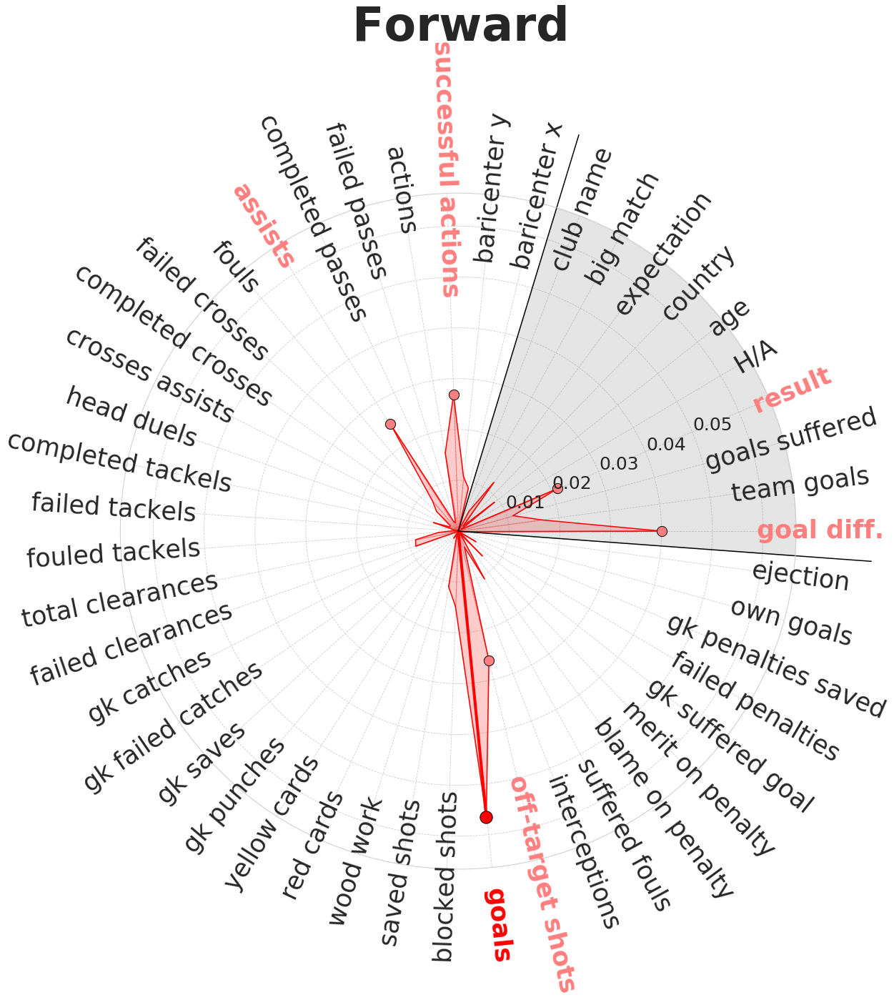

In [12]:
aaaa = importance_att.to_frame()
aaaa.rename(columns = {0:'vals'}, inplace = True)
aaaa = aaaa[aaaa.index.isin(select_features_for_radar)]
aaaa = aaaa.iloc[:,0]
fig,ax = plot_polar(aaaa, 'Forward', 'red')
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.savefig('img/attackers_global.pdf')
plt.show()

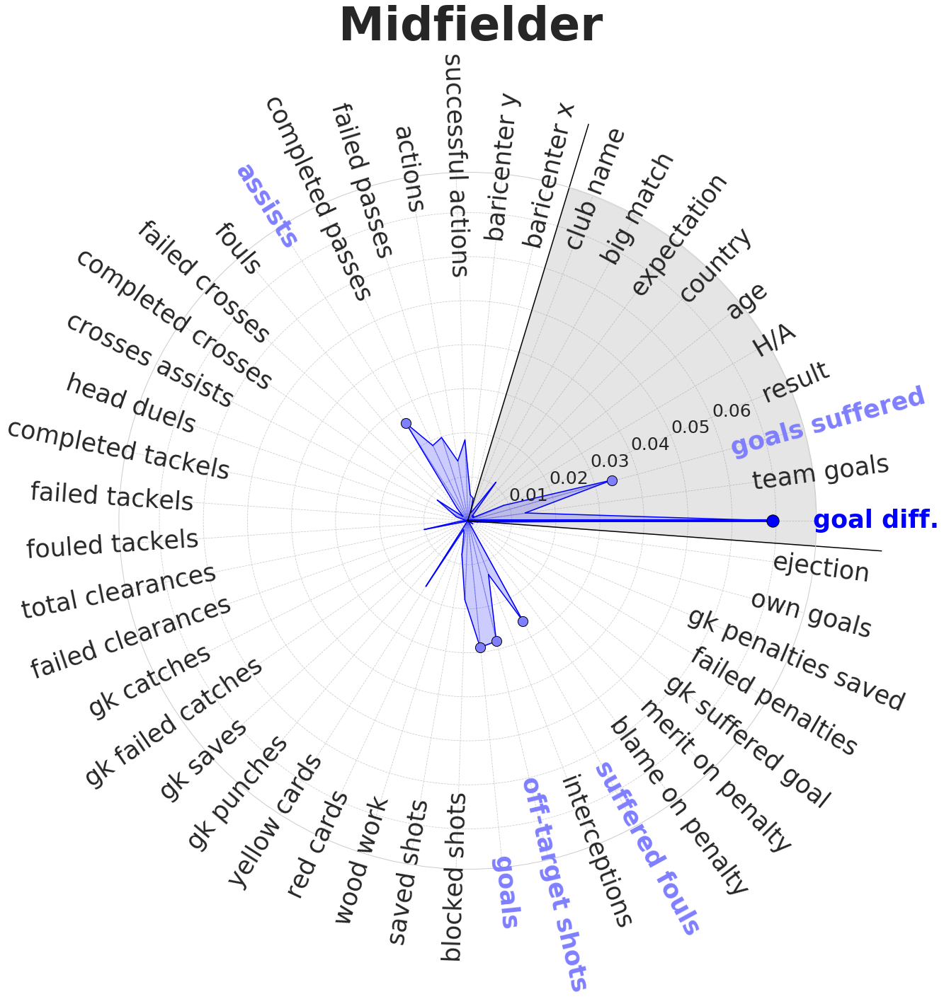

In [13]:
cccc = importance_mid.to_frame()
cccc.rename(columns = {0:'vals'}, inplace = True)
cccc = cccc[cccc.index.isin(select_features_for_radar)]
cccc = cccc.iloc[:,0]
fig,ax = plot_polar(cccc, 'Midfielder', 'blue')
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.savefig('img/midfielder_global.pdf')
plt.show()

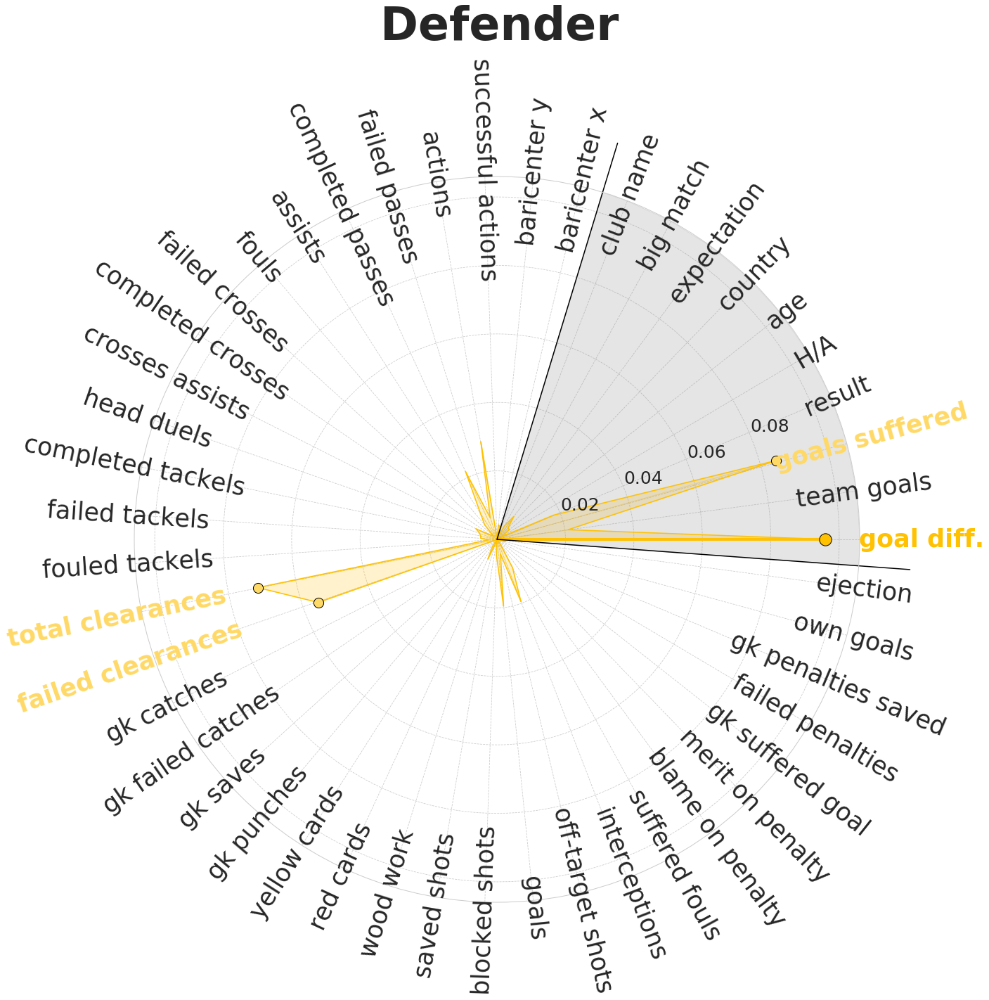

In [14]:
dddd = importance_def.to_frame()
dddd.rename(columns = {0:'vals'}, inplace = True)
dddd = dddd[dddd.index.isin(select_features_for_radar)]
dddd = dddd.iloc[:,0]
fig,ax = plot_polar(dddd, 'Defender', '#ffc100')
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.savefig('img/defence_global.pdf')
plt.show()

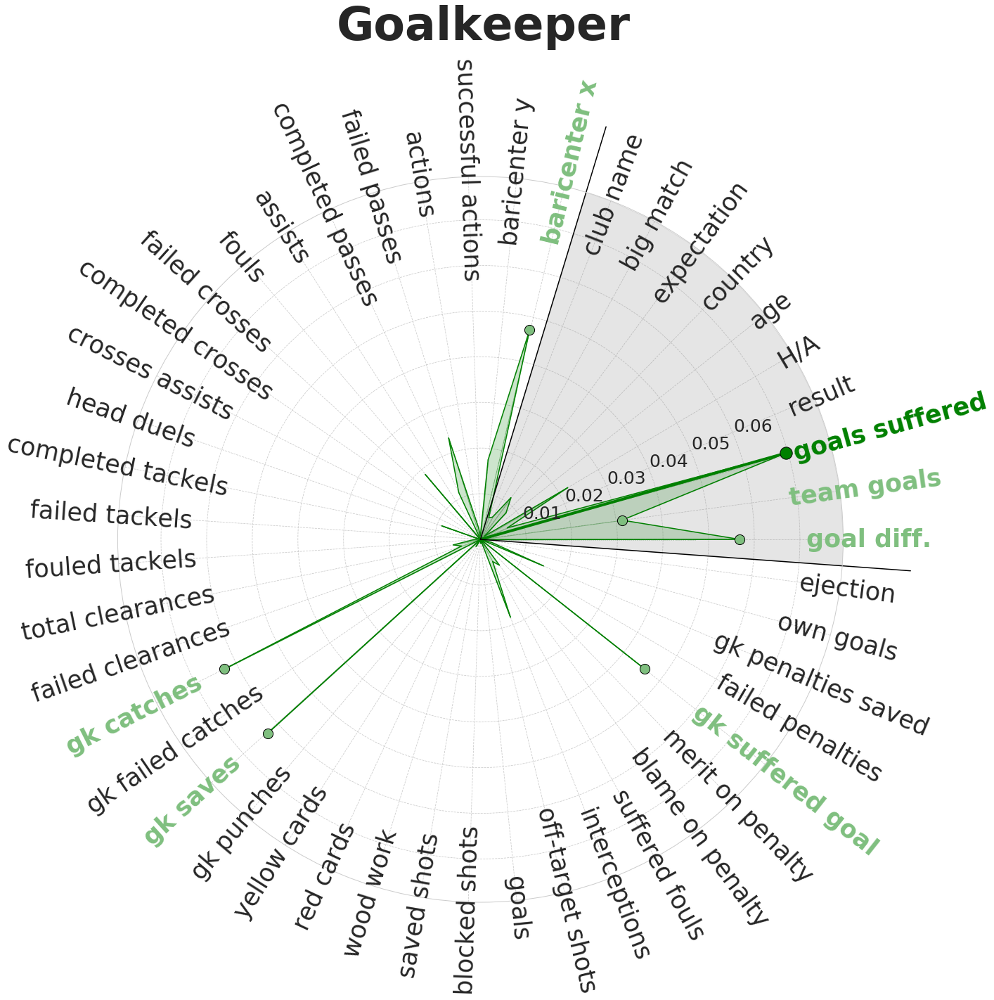

In [15]:
pppp = importance_gk.to_frame()
pppp.rename(columns = {0:'vals'}, inplace = True)
pppp = pppp[pppp.index.isin(select_features_for_radar)]
pppp = pppp.iloc[:,0]
fig,ax = plot_polar(pppp, 'Goalkeeper', 'green')
plt.grid(True, linestyle='--')
plt.tight_layout()
plt.savefig('img/goalkeeper_global.pdf')
plt.show()

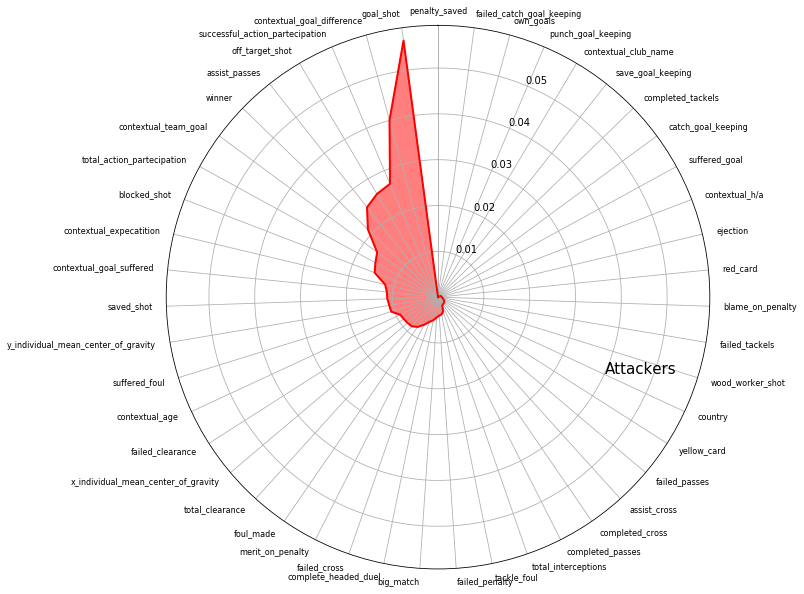

In [16]:
explanation_soccer_analysis.plot_radar_chart(importance_att, 'red', 'Attackers')

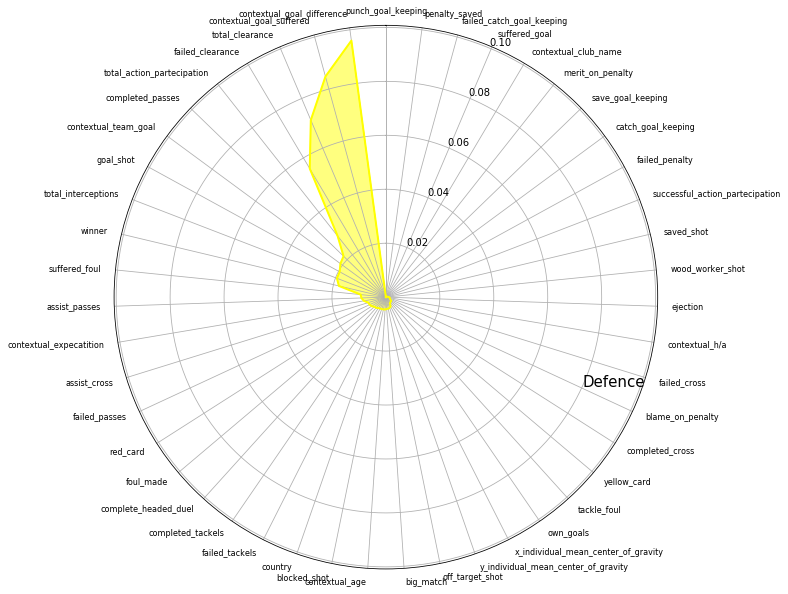

In [17]:
explanation_soccer_analysis.plot_radar_chart(importance_def, 'yellow', 'Defence')

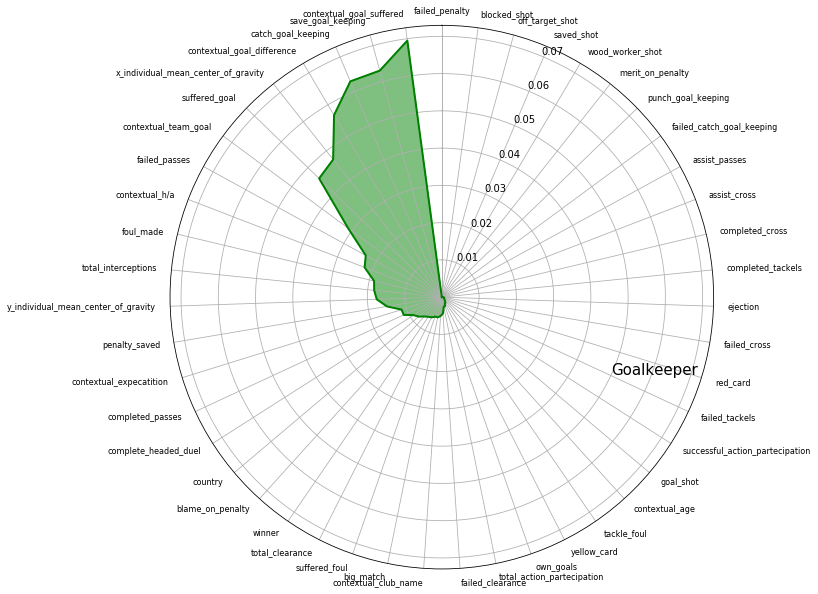

In [18]:
explanation_soccer_analysis.plot_radar_chart(importance_gk, 'green', 'Goalkeeper')

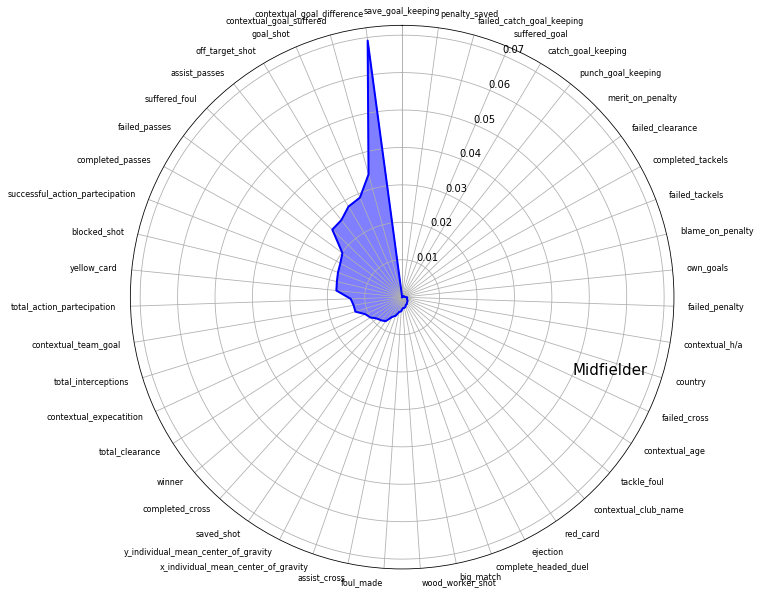

In [19]:
explanation_soccer_analysis.plot_radar_chart(importance_mid, 'blue', 'Midfielder')

In [10]:
contextual = ['contextual_goal_difference', 'contextual_team_goal', 'contextual_goal_suffered', 'winner', 'contextual_h/a',
                            'contextual_age', 'country', 'contextual_expecatition', 'big_match', 'contextual_club_name']

def gini(x):
    # (Warning: This is a concise implementation, but it is O(n**2)
    # in time and memory, where n = len(x).  *Don't* pass in huge
    # samples!)
    
    #convert pandas series to numpy array
    x = x.to_numpy()

    # Mean absolute difference
    mad = np.abs(np.subtract.outer(x, x)).mean()
    # Relative mean absolute difference
    rmad = mad/np.mean(x)
    # Gini coefficient
    g = 0.5 * rmad
    return g

def extract_statistics_from_skater_importances(att, mid, de, gk,treshold):
    
    noncontextual = list(set(select_features_for_radar) - set(contextual))
    
    total_num_features = len(select_features_for_radar)
    total_num_contextual = len(contextual)
    total_num_non_contextual = len(noncontextual)
    
    #elaborate the list of features importance
    att = att.to_frame()
    attfeatures = att.reindex(select_features_for_radar)
    attcontextual = att.reindex(contextual)
    attnoncontextual = att.reindex(noncontextual)
    att = att.reindex(select_features_for_radar)
    att.rename(columns = {0:'vals'}, inplace = True)
    attfeatures.rename(columns = {0:'vals'}, inplace = True)
    attcontextual.rename(columns = {0:'vals'}, inplace = True)
    attnoncontextual.rename(columns={0:'vals'}, inplace = True)
    attfeatures = (attfeatures['vals'] >= treshold)
    attcontextual = (attcontextual['vals'] >= treshold)
    attnoncontextual = (attnoncontextual['vals'] >= treshold)
    att = att.vals 

    mid = mid.to_frame()
    midfeatures = mid.reindex(select_features_for_radar)
    midcontextual = mid.reindex(contextual)
    midnoncontextual = mid.reindex(noncontextual)
    mid = mid.reindex(select_features_for_radar)
    mid.rename(columns = {0:'vals'}, inplace = True)
    midfeatures.rename(columns = {0:'vals'}, inplace = True)
    midcontextual.rename(columns = {0:'vals'}, inplace = True)
    midnoncontextual.rename(columns={0: 'vals'}, inplace = True)
    midfeatures = (midfeatures['vals'] >= treshold)
    midcontextual = (midcontextual['vals'] >= treshold)
    midnoncontextual = (midnoncontextual['vals'] >= treshold)
    mid = mid.vals

    de = de.to_frame()
    defeatures = de.reindex(select_features_for_radar)
    decontextual = de.reindex(contextual)
    denoncontextual = de.reindex(noncontextual)
    de = de.reindex(select_features_for_radar)
    de.rename(columns = {0:'vals'}, inplace = True)
    defeatures.rename(columns = {0:'vals'}, inplace = True)
    decontextual.rename(columns = {0:'vals'}, inplace = True)
    denoncontextual.rename(columns={0:'vals'}, inplace = True)
    defeatures = (defeatures['vals'] >= treshold)
    decontextual = (decontextual['vals'] >= treshold)
    denoncontextual = (denoncontextual['vals'] >= treshold)
    de = de.vals

    gk = gk.to_frame()
    gkfeatures = gk.reindex(select_features_for_radar)
    gkcontextual = gk.reindex(contextual)
    gknoncontextual = gk.reindex(noncontextual)
    gk = gk.reindex(select_features_for_radar)
    gk.rename(columns = {0:'vals'}, inplace = True)
    gkfeatures.rename(columns = {0:'vals'}, inplace = True)
    gkcontextual.rename(columns = {0:'vals'}, inplace = True)
    gknoncontextual.rename(columns={0:'vals'}, inplace = True)
    gkfeatures = (gkfeatures['vals'] >= treshold)
    gkcontextual = (gkcontextual['vals'] >= treshold)
    gknoncontextual = (gknoncontextual['vals'] >= treshold)
    gk = gk.vals
    
    list_std = []
    list_gini = []
    list_percentage_active = []
    list_percentage_contextual_active = []
    list_contextual_over_total = []
    list_non_conxtual_over_total_non_contextual = []
    
    counter_contextual = dict(gk=0, de = 0, mid=0, att=0)
    counter_features = dict(gk=0, de = 0, mid=0, att=0)
    counter_non_contextual = dict(gk=0, de=0, mid=0, att=0)
    
    for el in gkcontextual:
        if(el == True):
            counter_contextual['gk'] += 1
    for el in gkfeatures:
        if(el == True):
            counter_features['gk'] += 1
    for el in decontextual:
        if(el == True):
            counter_contextual['de'] += 1
    for el in defeatures:
        if(el == True):
            counter_features['de'] += 1
    for el in midcontextual:
        if(el == True):
            counter_contextual['mid'] += 1
    for el in midfeatures:
        if(el == True):
            counter_features['mid'] += 1
    for el in attcontextual:
        if(el == True):
            counter_contextual['att'] += 1
    for el in attfeatures:
        if(el == True):
            counter_features['att'] += 1
    for el in attnoncontextual:
        if(el == True):
            counter_non_contextual['att'] += 1
    for el in midnoncontextual:
        if(el == True):
            counter_non_contextual['mid'] += 1
    for el in denoncontextual:
        if(el == True):
            counter_non_contextual['de'] += 1
    for el in gknoncontextual:
        if(el == True):
            counter_non_contextual['gk'] += 1
    
    
    list_std.append(round(variation(gk),2))
    list_std.append(round(variation(de),2))
    list_std.append(round(variation(mid),2))
    list_std.append(round(variation(att),2))
    
    list_gini.append(round(gini(gk),2))
    list_gini.append(round(gini(de),2))
    list_gini.append(round(gini(mid),2))
    list_gini.append(round(gini(att),2))
    
    list_percentage_active.append(round(counter_features['gk']/total_num_features,2))
    list_percentage_active.append(round(counter_features['de']/total_num_features,2))
    list_percentage_active.append(round(counter_features['mid']/total_num_features,2))
    list_percentage_active.append(round(counter_features['att']/total_num_features,2))
    
    list_percentage_contextual_active.append(round(counter_contextual['gk']/total_num_contextual,2))
    list_percentage_contextual_active.append(round(counter_contextual['de']/total_num_contextual,2))
    list_percentage_contextual_active.append(round(counter_contextual['mid']/total_num_contextual,2))
    list_percentage_contextual_active.append(round(counter_contextual['att']/total_num_contextual,2))
    
    list_contextual_over_total.append(round(counter_contextual['gk']/total_num_features,2))
    list_contextual_over_total.append(round(counter_contextual['de']/total_num_features,2))
    list_contextual_over_total.append(round(counter_contextual['mid']/total_num_features,2))
    list_contextual_over_total.append(round(counter_contextual['att']/total_num_features,2))
    
    list_non_conxtual_over_total_non_contextual.append(round(counter_non_contextual['gk']/total_num_non_contextual, 2))
    list_non_conxtual_over_total_non_contextual.append(round(counter_non_contextual['de']/total_num_non_contextual, 2))
    list_non_conxtual_over_total_non_contextual.append(round(counter_non_contextual['mid']/total_num_non_contextual, 2))
    list_non_conxtual_over_total_non_contextual.append(round(counter_non_contextual['att']/total_num_non_contextual, 2))
    
    stats = pd.DataFrame()
    stats['role'] = ['Goalkeeper', 'Defender', 'Midfielder', 'Forward']
    stats['coefficient of variation'] = list_std
    stats['gini'] = list_gini
    stats['active features'] = list_percentage_active
    stats['active contextual'] = list_percentage_contextual_active
    stats['total active contextual'] = list_contextual_over_total
    stats['total active non contextual'] = list_non_conxtual_over_total_non_contextual
    
    
    return stats
    

In [11]:
stats02 = extract_statistics_from_skater_importances(importance_att, importance_mid, importance_def, importance_gk, 0.02)

In [12]:
stats04 = extract_statistics_from_skater_importances(importance_att, importance_mid, importance_def, importance_gk, 0.04)

In [13]:
stats06 = extract_statistics_from_skater_importances(importance_att, importance_mid, importance_def, importance_gk, 0.06)

In [14]:
stats08 = extract_statistics_from_skater_importances(importance_att, importance_mid, importance_def, importance_gk, 0.08)

In [15]:
print(stats02.to_latex())

\begin{tabular}{llrrrrrr}
\toprule
{} &        role &  coefficient of variation &  gini &  active features &  active contextual &  total active contextual &  total active non contextual \\
\midrule
0 &  Goalkeeper &                      1.54 &  0.71 &             0.19 &                0.4 &                     0.08 &                         0.14 \\
1 &    Defender &                      1.84 &  0.72 &             0.15 &                0.3 &                     0.06 &                         0.11 \\
2 &  Midfielder &                      1.39 &  0.64 &             0.12 &                0.2 &                     0.04 &                         0.11 \\
3 &     Forward &                      1.35 &  0.62 &             0.12 &                0.2 &                     0.04 &                         0.11 \\
\bottomrule
\end{tabular}



plot evolution of active features based on treshold

goalkeeper

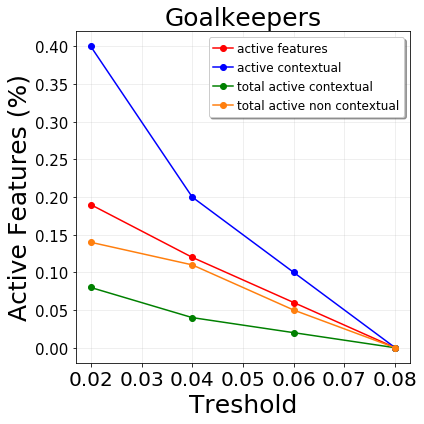

In [16]:
plt.figure(figsize = (6,6))
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Goalkeeper']['active features'], stats04[stats04['role'] == 'Goalkeeper']['active features'],
                                   stats06[stats06['role'] == 'Goalkeeper']['active features'], stats08[stats08['role'] == 'Goalkeeper']['active features']], color='red', marker='o', label='active features')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Goalkeeper']['active contextual'], stats04[stats04['role'] == 'Goalkeeper']['active contextual'],
                                   stats06[stats06['role'] == 'Goalkeeper']['active contextual'], stats08[stats08['role'] == 'Goalkeeper']['active contextual']], color='blue', marker='o', label='active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Goalkeeper']['total active contextual'], stats04[stats04['role'] == 'Goalkeeper']['total active contextual'],
                                   stats06[stats06['role'] == 'Goalkeeper']['total active contextual'], stats08[stats08['role'] == 'Goalkeeper']['total active contextual']], color='green', marker='o', label='total active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Goalkeeper']['total active non contextual'], stats04[stats04['role'] == 'Goalkeeper']['total active non contextual'],
                                   stats06[stats06['role'] == 'Goalkeeper']['total active non contextual'], stats08[stats08['role'] == 'Goalkeeper']['total active non contextual']], color='tab:orange', marker='o', label='total active non contextual')
plt.title('Goalkeepers', fontsize=25)
plt.xlabel('Treshold', fontsize=25)
plt.ylabel('Active Features (%)', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=15)
plt.legend(fontsize=12, frameon=True, shadow=True, handlelength=1.6, handletextpad=0.4)
plt.grid(True, alpha =0.25)
plt.tight_layout()
plt.savefig('img/metrics_evolution_goalkeeper.pdf')
plt.show()

defender

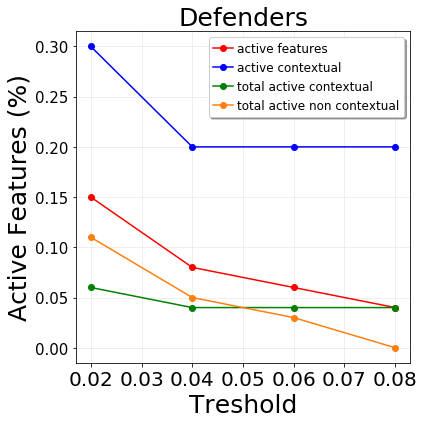

In [17]:
plt.figure(figsize = (6,6))
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Defender']['active features'][1], stats04[stats04['role'] == 'Defender']['active features'][1],
                                   stats06[stats06['role'] == 'Defender']['active features'][1], stats08[stats08['role'] == 'Defender']['active features'][1]], color='red', marker='o', label='active features')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Defender']['active contextual'][1], stats04[stats04['role'] == 'Defender']['active contextual'][1],
                                   stats06[stats06['role'] == 'Defender']['active contextual'][1], stats08[stats08['role'] == 'Defender']['active contextual'][1]], color='blue', marker='o', label='active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Defender']['total active contextual'][1], stats04[stats04['role'] == 'Defender']['total active contextual'][1],
                                   stats06[stats06['role'] == 'Defender']['total active contextual'][1], stats08[stats08['role'] == 'Defender']['total active contextual'][1]], color='green', marker='o', label='total active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Defender']['total active non contextual'][1], stats04[stats04['role'] == 'Defender']['total active non contextual'][1],
                                   stats06[stats06['role'] == 'Defender']['total active non contextual'][1], stats08[stats08['role'] == 'Defender']['total active non contextual'][1]], color='tab:orange', marker='o', label='total active non contextual')
plt.title('Defenders', fontsize=25)
plt.xlabel('Treshold', fontsize=25)
plt.ylabel('Active Features (%)', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=15)
plt.legend(fontsize=12, frameon=True, shadow=True, handlelength=1.6, handletextpad=0.4)
plt.grid(True, alpha =0.25)
plt.tight_layout()
plt.savefig('img/metrics_evolution_defender.pdf')
plt.show()

midfielder

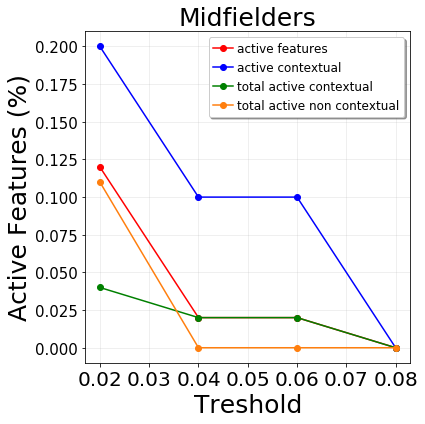

In [18]:
plt.figure(figsize = (6,6))
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Midfielder']['active features'][2], stats04[stats04['role'] == 'Midfielder']['active features'][2],
                                   stats06[stats06['role'] == 'Midfielder']['active features'][2], stats08[stats08['role'] == 'Midfielder']['active features'][2]], color='red', marker='o', label='active features')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Midfielder']['active contextual'][2], stats04[stats04['role'] == 'Midfielder']['active contextual'][2],
                                   stats06[stats06['role'] == 'Midfielder']['active contextual'][2], stats08[stats08['role'] == 'Midfielder']['active contextual'][2]], color='blue', marker='o', label='active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Midfielder']['total active contextual'][2], stats04[stats04['role'] == 'Midfielder']['total active contextual'][2],
                                   stats06[stats06['role'] == 'Midfielder']['total active contextual'][2], stats08[stats08['role'] == 'Midfielder']['total active contextual'][2]], color='green', marker='o', label='total active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Midfielder']['total active non contextual'][2], stats04[stats04['role'] == 'Midfielder']['total active non contextual'][2],
                                   stats06[stats06['role'] == 'Midfielder']['total active non contextual'][2], stats08[stats08['role'] == 'Midfielder']['total active non contextual'][2]], color='tab:orange', marker='o', label='total active non contextual')
plt.title('Midfielders', fontsize=25)
plt.xlabel('Treshold', fontsize=25)
plt.ylabel('Active Features (%)', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=15)
plt.legend(fontsize=12, frameon=True, shadow=True, handlelength=1.6, handletextpad=0.4)
plt.grid(True, alpha =0.25)
plt.tight_layout()
plt.savefig('img/metrics_evolution_midfielder.pdf')
plt.show()

forward

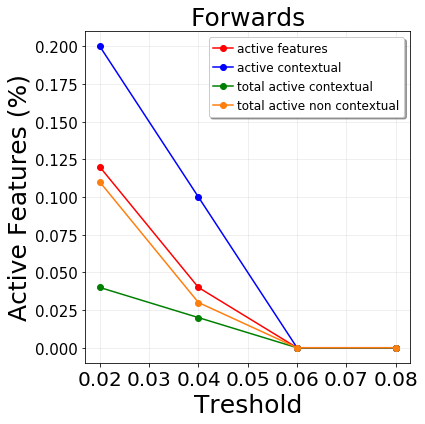

In [19]:
plt.figure(figsize = (6,6))
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Forward']['active features'][3], stats04[stats04['role'] == 'Forward']['active features'][3],
                                   stats06[stats06['role'] == 'Forward']['active features'][3], stats08[stats08['role'] == 'Forward']['active features'][3]], color='red', marker='o', label='active features')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Forward']['active contextual'][3], stats04[stats04['role'] == 'Forward']['active contextual'][3],
                                   stats06[stats06['role'] == 'Forward']['active contextual'][3], stats08[stats08['role'] == 'Forward']['active contextual'][3]], color='blue', marker='o', label='active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Forward']['total active contextual'][3], stats04[stats04['role'] == 'Forward']['total active contextual'][3],
                                   stats06[stats06['role'] == 'Forward']['total active contextual'][3], stats08[stats08['role'] == 'Forward']['total active contextual'][3]], color='green', marker='o', label='total active contextual')
plt.plot([0.02, 0.04, 0.06, 0.08], [stats02[stats02['role'] == 'Forward']['total active non contextual'][3], stats04[stats04['role'] == 'Forward']['total active non contextual'][3],
                                   stats06[stats06['role'] == 'Forward']['total active non contextual'][3], stats08[stats08['role'] == 'Forward']['total active non contextual'][3]], color='tab:orange', marker='o', label='total active non contextual')
plt.title('Forwards', fontsize=25)
plt.xlabel('Treshold', fontsize=25)
plt.ylabel('Active Features (%)', fontsize=25)
plt.xticks(fontsize=20)
plt.yticks(fontsize=15)
plt.legend(fontsize=12, frameon=True, shadow=True, handlelength=1.6, handletextpad=0.4)
plt.grid(True, alpha =0.25)
plt.tight_layout()
plt.savefig('img/metrics_evolution_forward.pdf')
plt.show()

## B2. Model Local Explanation Applyied over the mord implementation

For each role we took the the mord implementation that better fit with the dataset, best parameters were computed at the beginning of the notebook.
Then using the trained model and using **SHAP** we computed the shap values selecting those that are interesting in the reason why the model select a specific solution

##### Applyied for Attackers

In [6]:
explainer_att, shap_values_att, predictions_enc_att, predictions_t_att, list_of_motivations_att = explanation_soccer_analysis.locals_explanation_using_shap('load', a_all_score, attacker_labels_training_set, attacker_labels_test_set, 1, attacker_train_set, attacker_test_set,'', integral_att_test_set)

Using 5134 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [7]:
shap.initjs()
shap.force_plot(explainer_att.expected_value[7], shap_values_att[7], attacker_test_set)

##### Applyied for Midfielder

In [8]:
explainer_mid, shap_values_mid, predictions_enc_mid, predictions_t_mid, list_of_motivations_mid = explanation_soccer_analysis.locals_explanation_using_shap('load', c_all_score, mid_labels_training_set, mid_labels_test_set, 0.5, mid_train_set, mid_test_set,'midfielder_', integral_mid_test_set)

Using 9485 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [9]:
shap.force_plot(explainer_mid.expected_value[7], shap_values_mid[7], mid_test_set)

##### Applyied for Defence

In [10]:
explainer_def, shap_values_def, predictions_enc_def, predictions_t_def, list_of_motivations_def = explanation_soccer_analysis.locals_explanation_using_shap('load', d_all_score, def_labels_training_set, def_labels_test_set, 0.7, def_train_set, def_test_set,'defence_', integral_def_test_set)

Using 8640 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [11]:
shap.force_plot(explainer_def.expected_value[7], shap_values_def[7], def_test_set)

#### Applyied for Goalkeeper

In [12]:
explainer_gk, shap_values_gk, predictions_enc_gk, predictions_t_gk, list_of_motivations_gk = explanation_soccer_analysis.locals_explanation_using_shap('load', p_all_score, gk_labels_training_set, gk_labels_test_set, 1, gk_train_set, gk_test_set,'goalkeeper_', integral_gk_test_set)

Using 2013 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


In [13]:
shap.force_plot(explainer_gk.expected_value[7], shap_values_gk[7], gk_test_set)

In [14]:
pre = [*predictions_t_mid, *predictions_t_att, *predictions_t_def, *predictions_t_gk]

In [15]:
matches = [*list(mid_test_match_id), *list(attacker_test_match_id), *list(def_test_match_id), *list(gk_test_match_id)]

In [16]:
player_id = [*list(mid_test_player_id), *list(attacker_test_player_id), *list(def_test_player_id), *list(gk_test_player_id)]

In [17]:
actual = [*mid_labels_test_set, *attacker_labels_test_set, *def_labels_test_set, *gk_labels_test_set]

In [18]:
teams = [*mid_test_team_id, *attacker_test_team_id, *def_test_team_id, *gk_test_team_id]

In [19]:
motivations = [*list_of_motivations_mid, *list_of_motivations_att, *list_of_motivations_def, *list_of_motivations_gk]

In [20]:
role = [*mid_test_role, *attacker_test_role, *def_test_role, *gk_test_role]

In [21]:
dataset_for_experiment = pd.DataFrame()
dataset_for_experiment['match_id'] = matches
dataset_for_experiment['team_id'] = teams
dataset_for_experiment['player_name'] = player_id
dataset_for_experiment['human_perception'] = " "
dataset_for_experiment['model_prediction'] = pre
dataset_for_experiment['real_prediction'] = actual
dataset_for_experiment['prediction_motivations'] = motivations
dataset_for_experiment['role'] = role

In [22]:
matches_label = []
for row in dataset_for_experiment.values:
    for ma in dfmatc.values:
        if(row[0] == ma[13]):
            matches_label.append(ma[5])

In [23]:
dataset_for_experiment['match_label'] = matches_label

In [24]:
for el in dataset_for_experiment.values:
    if(el[4] >= 6.5  and el[5] < 6):
        print(el)
    if(el[4] < 6  and el[5] >= 6.5):
        print(el)

[2759498 3162 'LULIC' ' ' 5.5 6.5
 {'contextual_goal_difference': -2, 'contextual_goal_suffered': 3, 'total_shot': 0, 'suffered_foul': 0, 'failed_passes': 11, 'failed_passes_contribution_feature': 0.16666666666666666}
 'C' 'Roma - Lazio, 3 - 1']
[2759546 3159 'DYBALA' ' ' 6.5 5.5
 {'wood_worker_shot_contribution_feature': 1.0, 'contextual_goal_difference': 2, 'successful_action_partecipation': 11, 'winner': 1, 'goals': 0, 'completed_passes_contribution_feature': 0.06805293005671077, 'total_shot': 3, 'big_match': 1, 'dangerous_failed_dribblings': 0.1, 'total_interceptions_contribution_feature': 0.1, 'dangerous_complete_passes': 1.6000000000000003, 'contextual_team_goal': 2, 'contextual_goal_suffered': 0, 'goal_shot': 0, 'failed_dribblings_contribution_feature': 0.42857142857142855, 'total_action_partecipation_contribution_feature': 0.07926829268292683, 'y_individual_mean_center_of_gravity': 62.04}
 'A' 'Milan - Juventus, 0 - 2']
[2759711 3162 'PATRIC' ' ' 6.5 5.5
 {'contextual_goal_diff

In [55]:
with pd.option_context('display.max_rows', None, 'display.max_columns', TEST_SET.shape[1]):
    print(TEST_SET[TEST_SET['player_role_fantacalcio'] == 'A'])

      match_id  match_day  team_id  player_id  minutes_played  red_card  \
433    2759803         37     3193     115933              74         0   
440    2759803         37     3193      21177              90         0   
443    2759803         37     3193     388064              44         0   
444    2759803         37     3193     225946              16         0   
446    2759803         37     3173      22933              66         0   
448    2759803         37     3173     134441              80         0   
803    2759775         35     3162     101635              55         0   
810    2759775         35     3162      21384              90         0   
823    2759775         35     3172      21077              90         0   
824    2759775         35     3172      86243              90         0   
2468   2759709         28     3157     329061              90         0   
2470   2759709         28     3157      11063              90         0   
2473   2759709         28

In [31]:
dataset_for_experiment.sort_values(['match_id', 'team_id'])

,match_id,team_id,player_name,human_perception,model_prediction,real_prediction,prediction_motivations,role,match_label
83,2759498,3158,PASTORE,,6.0,6.0,{'total_passes_contribution_feature': 0.046583...,C,"Roma - Lazio, 3 - 1"
84,2759498,3158,DE ROSSI,,6.5,6.5,"{'contextual_goal_difference': 2, 'key_passes'...",C,"Roma - Lazio, 3 - 1"
85,2759498,3158,NZONZI,,6.0,6.0,{'total_passes_contribution_feature': 0.114906...,C,"Roma - Lazio, 3 - 1"
136,2759498,3158,EL SHAARAWY,,6.0,5.0,"{'goals': 0, 'contextual_goal_difference': 2, ...",A,"Roma - Lazio, 3 - 1"
220,2759498,3158,FAZIO,,7.0,5.5,"{'goal_shot': 1, 'goals': 1, 'contextual_goal_...",D,"Roma - Lazio, 3 - 1"
...,...,...,...,...,...,...,...,...,...
139,2759803,3193,ZUKANOVIC,,6.0,6.0,{'total_passes_contribution_feature': 0.150289...,D,"Genoa - Cagliari, 1 - 1"
140,2759803,3193,CRISCITO,,6.5,7.0,"{'goal_shot': 1, 'goals': 1, 'total_shot': 3}",D,"Genoa - Cagliari, 1 - 1"
141,2759803,3193,GUNTER,,6.0,5.0,{'total_passes_contribution_feature': 0.164739...,D,"Genoa - Cagliari, 1 - 1"
142,2759803,3193,PEZZELLA GIU,,5.0,4.5,"{'red_card': 1, 'total_passes_contribution_fea...",D,"Genoa - Cagliari, 1 - 1"


In [65]:
dataset_for_experiment.to_csv('dataset_for_experiment.csv', index = False)

# Some explanation examples

I will figure out an explanation for each role. 
1 mid 
1 att
1 def
1 gk

Attacker CRISTIANO RONALDO 7.0

In [19]:
attacker_test_set.loc[47]
doc_num = 47
print('Actual Label:', attacker_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_att[doc_num])

Actual Label: 7.0
Predicted Label: 7.0


In [20]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_att.expected_value[6], shap_values_att[6][47,:], integral_att_test_set.reset_index(drop=True).iloc[47,:])

Attacker SUSO 5.0 

In [58]:
doc_num =11
print('Actual Label:', attacker_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_att[doc_num])

Actual Label: 5.0
Predicted Label: 5.5


In [63]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_att.expected_value[3], shap_values_att[3][11,:], integral_att_test_set.reset_index(drop=True).iloc[11,:])

Midfielder IVAN PERISIC 6.5 22

In [34]:
mid_test_set.loc[84]
doc_num = 84
print('Actual Label:', mid_labels_test_set.iloc[doc_num])
print('Predicted Label:',predictions_t_mid[doc_num])

Actual Label: 6.5
Predicted Label: 6.5


In [35]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_mid.expected_value[6], shap_values_mid[6][84,:], integral_mid_test_set.reset_index(drop=True).iloc[84,:])

Midfielder BIABIANY 4.5

In [71]:
doc_num = 24
print('Actual Label:', mid_labels_test_set.iloc[doc_num])
print('Predicted Label:',predictions_t_mid[doc_num])

Actual Label: 4.5
Predicted Label: 5.0


In [78]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_mid.expected_value[3], shap_values_mid[3][24,:], integral_mid_test_set.reset_index(drop=True).iloc[24,:])

Defender BASTOS 5.0 12

In [36]:
def_test_set.loc[12]
doc_num = 12
print('Actual Label:', def_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_def[doc_num])

Actual Label: 5.0
Predicted Label: 5.0


In [37]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_def.expected_value[4], shap_values_def[4][12,:], integral_def_test_set.reset_index(drop=True).iloc[12,:])

Defender MANCINI 7.5

In [83]:
doc_num = 53
print('Actual Label:', def_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_def[doc_num])

Actual Label: 7.5
Predicted Label: 7.0


In [88]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_def.expected_value[8], shap_values_def[8][53,:], integral_def_test_set.reset_index(drop=True).iloc[53,:])

Goalkeeper SCKESNY 7.0 17

In [38]:
gk_test_set.loc[17]
doc_num = 17
print('Actual Label:', gk_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_gk[doc_num])

Actual Label: 7.0
Predicted Label: 7.0


In [39]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_gk.expected_value[7], shap_values_gk[7][17,:], integral_gk_test_set.reset_index(drop=True).iloc[17,:])

Goalkeeper STRAKOSHA 5

In [100]:
doc_num = 18
print('Actual Label:', gk_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_gk[doc_num])

Actual Label: 5.0
Predicted Label: 6.0


In [101]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_gk.expected_value[5], shap_values_gk[5][18,:], integral_gk_test_set.reset_index(drop=True).iloc[18,:])

### DISAGREEMENT

Defender FAZIO 5.5 6.0 6.0 6.0

In [28]:
doc_num = 83
print('Actual Label:', def_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_def[doc_num])

Actual Label: 5.5
Predicted Label: 7.0


In [34]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_def.expected_value[8], shap_values_def[8][83,:], integral_def_test_set.reset_index(drop=True).iloc[83,:])

Midfielder DYBALA 5.5

In [49]:
attacker_test_set.loc[45]
doc_num = 45
print('Actual Label:', attacker_labels_test_set.iloc[doc_num])
print('Predicted Label:', predictions_t_att[doc_num])

Actual Label: 5.5
Predicted Label: 6.5


In [53]:
#first 2 index of expected and shap values mean the class, the result is the probability assigned to that class
shap.force_plot(explainer_att.expected_value[5], shap_values_att[5][45,:], integral_att_test_set.reset_index(drop=True).iloc[45,:])

## B3. GLOCAL EXPLANATIONS

For each role, for each ratings we compute those features that influences the most the probability of predicting that class.

### Forward role

4.5 Explanations

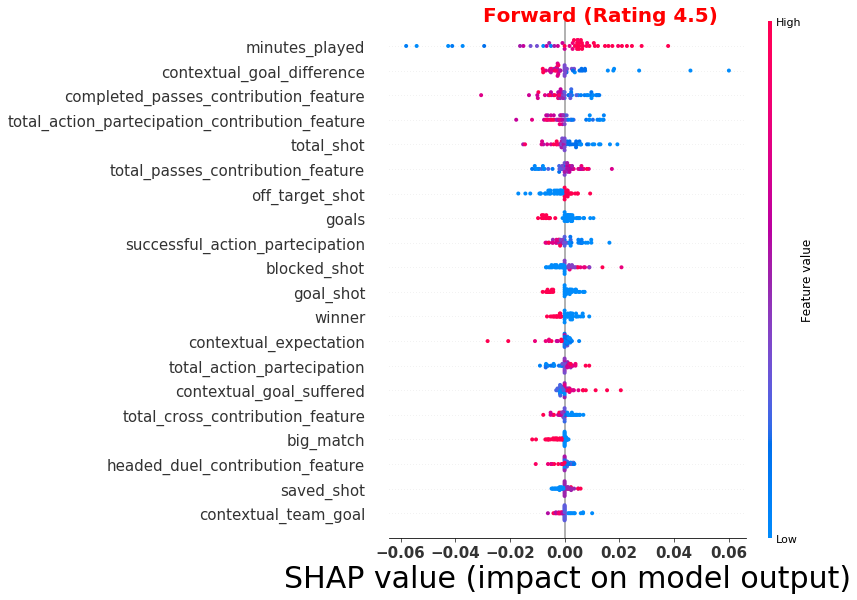

In [61]:
plt.figure(figsize=(6,6))
shap.summary_plot(shap_values_att[1], integral_att_test_set, show=False)
plt.text(-0.03,20,'Forward (Rating 4.5)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_45.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5 explanations

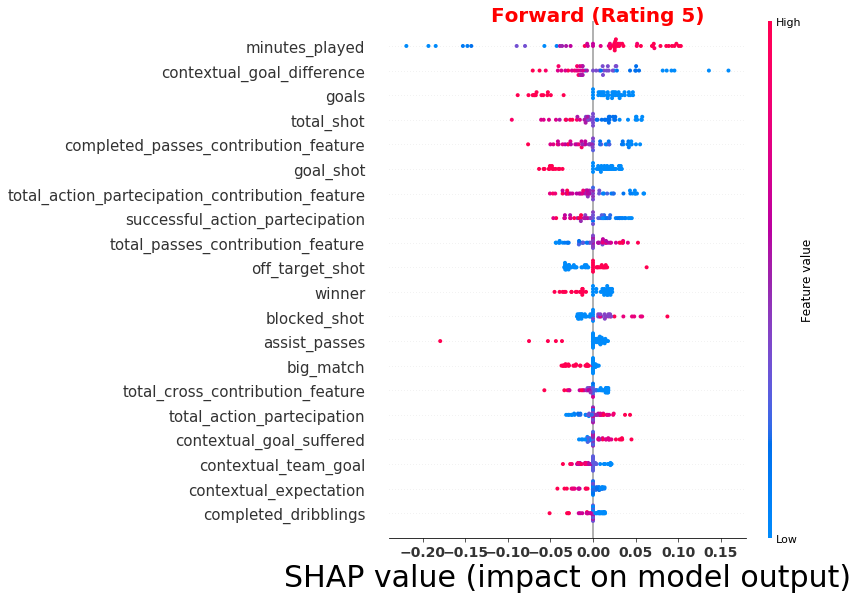

In [62]:
plt.figure(figsize=(40,20))
shap.summary_plot(shap_values_att[2], integral_att_test_set, show=False)
plt.text(-0.12,20,'Forward (Rating 5)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_5.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5.5 explanations

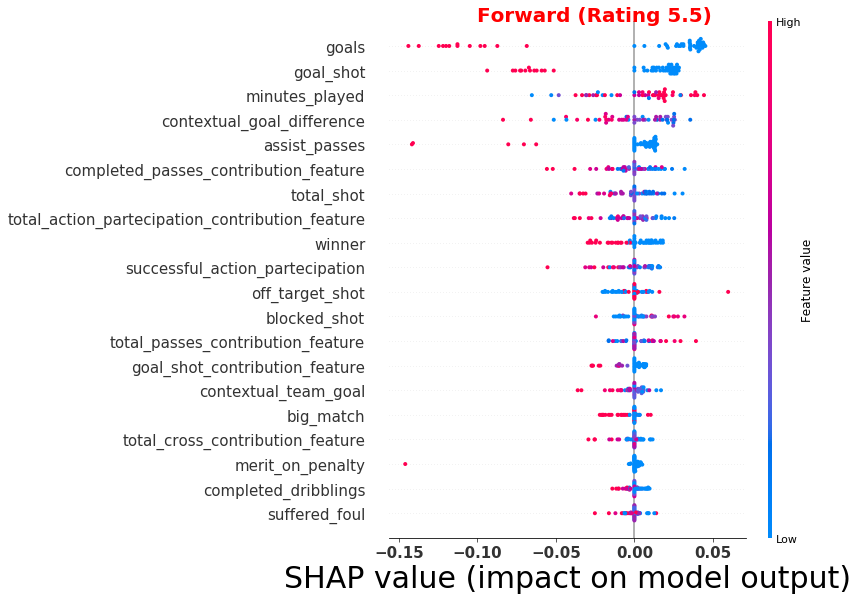

In [63]:
shap.summary_plot(shap_values_att[3], integral_att_test_set, show=False)
plt.text(-0.10,20,'Forward (Rating 5.5)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_55.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6 explanations

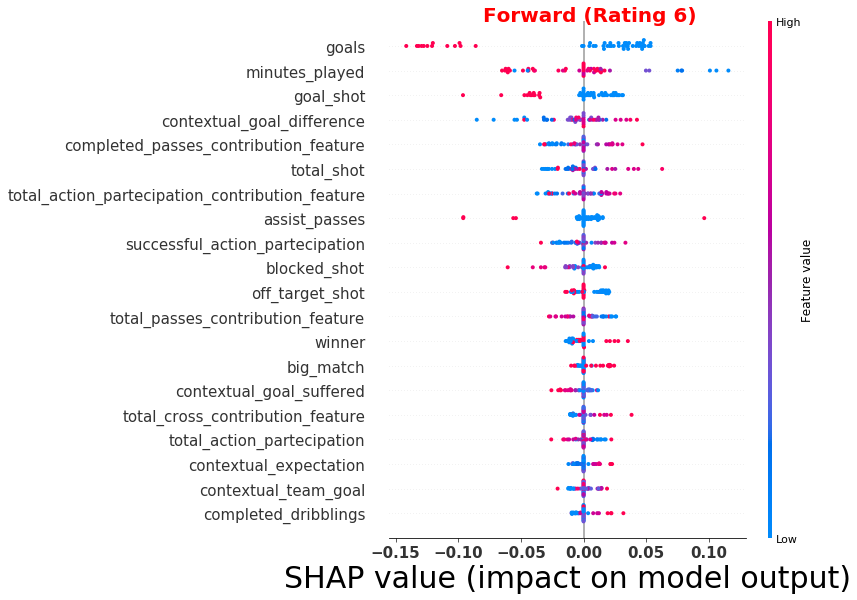

In [64]:
shap.summary_plot(shap_values_att[4], integral_att_test_set, show=False)
plt.text(-0.08,20,'Forward (Rating 6)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_6.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6.5 explanations

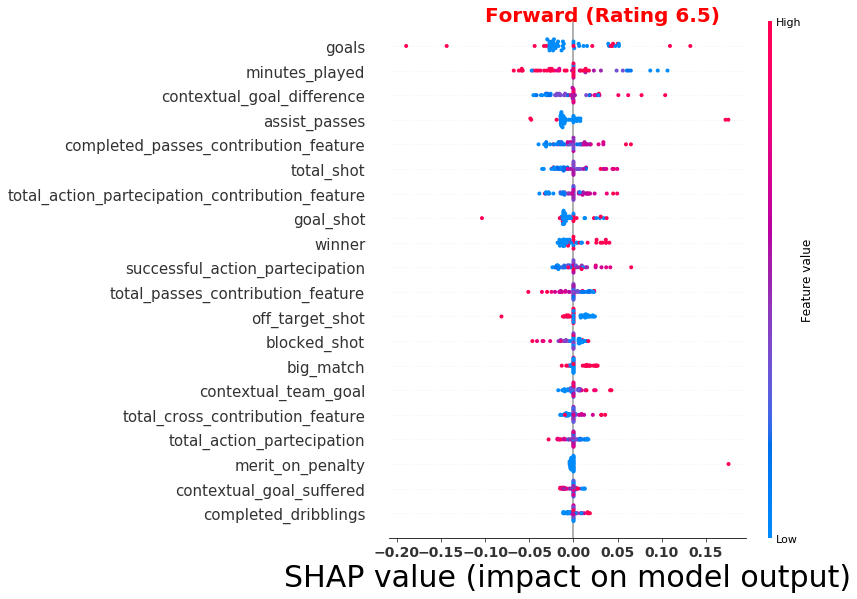

In [65]:
shap.summary_plot(shap_values_att[5], integral_att_test_set, show=False)
plt.text(-0.10,20,'Forward (Rating 6.5)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_65.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

7 explanations

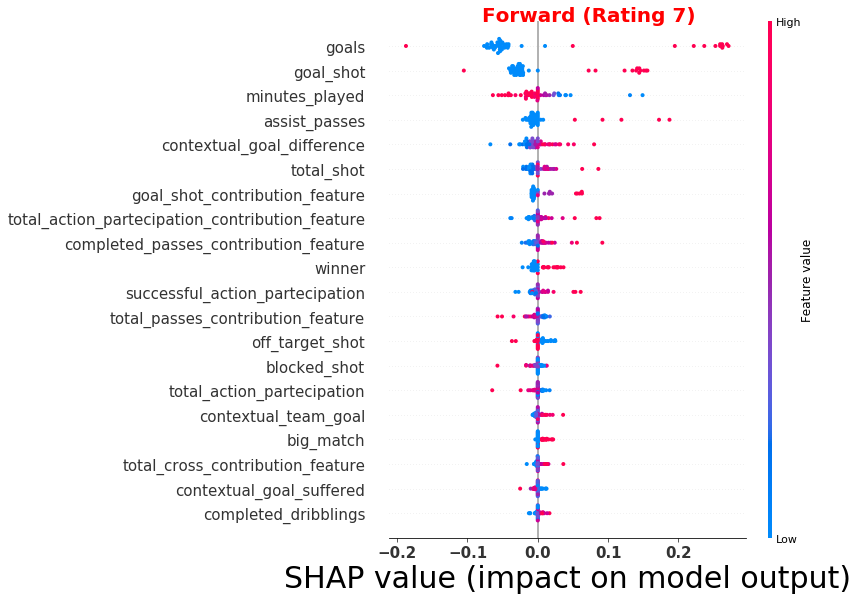

In [66]:
shap.summary_plot(shap_values_att[6], integral_att_test_set, show=False)
plt.text(-0.08,20,'Forward (Rating 7)', fontsize=20, fontweight='bold', color='red')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'att_glocal_explanation_7.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

### Midfielder Role

4.5 explanations

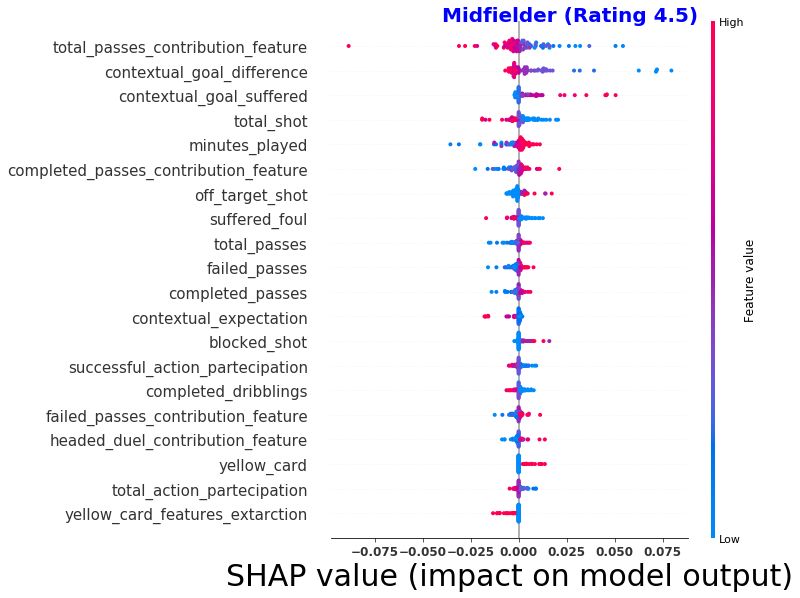

In [67]:
shap.summary_plot(shap_values_mid[2], integral_mid_test_set, show=False)
plt.text(-0.04,20,'Midfielder (Rating 4.5)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_45.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5 explanations

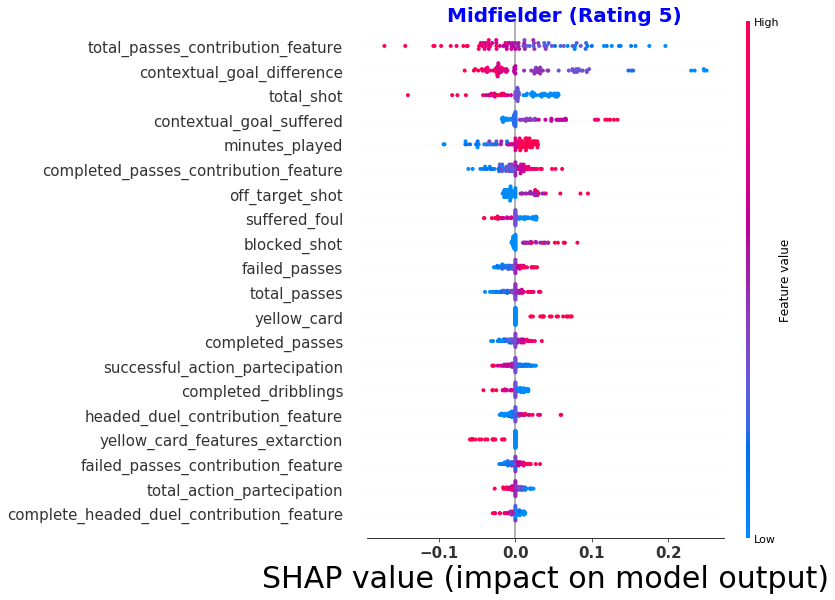

In [68]:
shap.summary_plot(shap_values_mid[3], integral_mid_test_set, show=False)
plt.text(-0.09,20,'Midfielder (Rating 5)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_5.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5.5 explanations

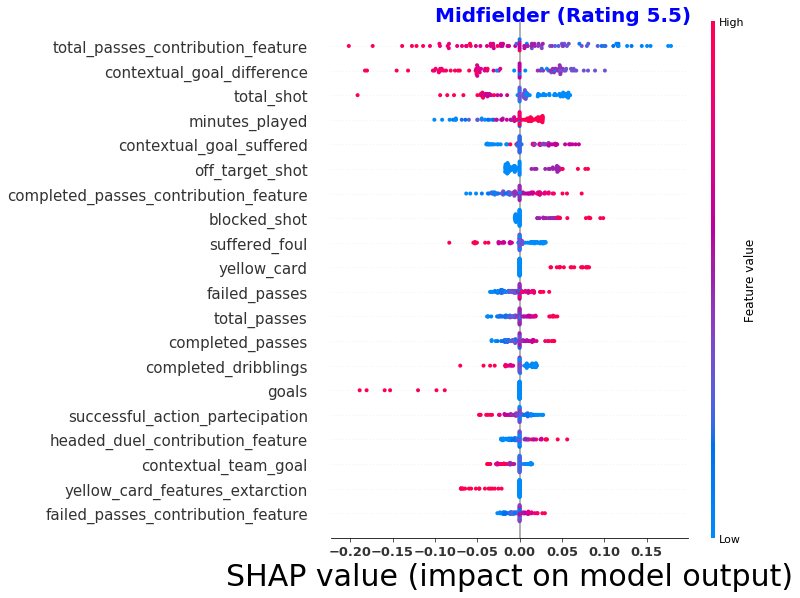

In [69]:
shap.summary_plot(shap_values_mid[4], integral_mid_test_set, show=False)
plt.text(-0.10,20,'Midfielder (Rating 5.5)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_55.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6 explanations

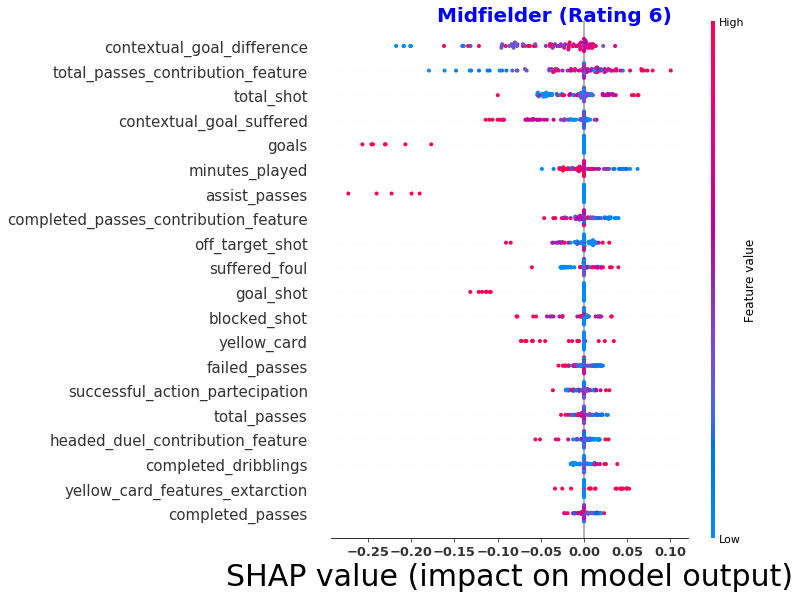

In [70]:
shap.summary_plot(shap_values_mid[5], integral_mid_test_set, show=False)
plt.text(-0.17,20,'Midfielder (Rating 6)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_6.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6.5 explanations

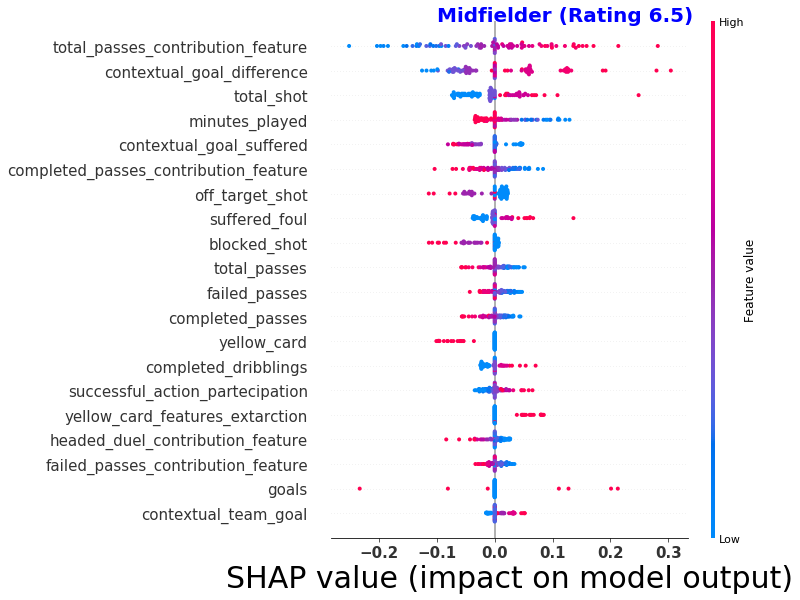

In [71]:
shap.summary_plot(shap_values_mid[6], integral_mid_test_set, show=False)
plt.text(-0.10,20,'Midfielder (Rating 6.5)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_65.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

7 explanations

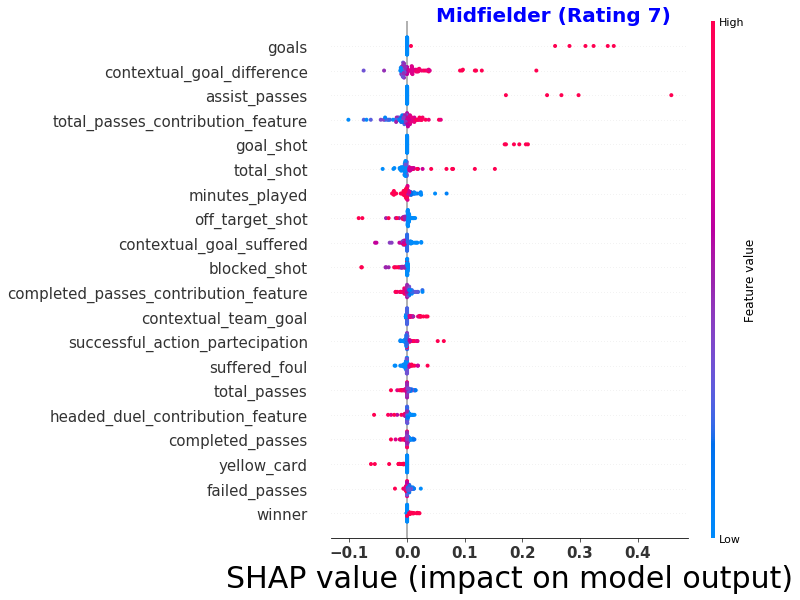

In [72]:
shap.summary_plot(shap_values_mid[7], integral_mid_test_set, show=False)
plt.text(0.05,20,'Midfielder (Rating 7)', fontsize=20, fontweight='bold', color='blue')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'mid_glocal_explanation_7.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

### Defence Role
4.5 Explanations

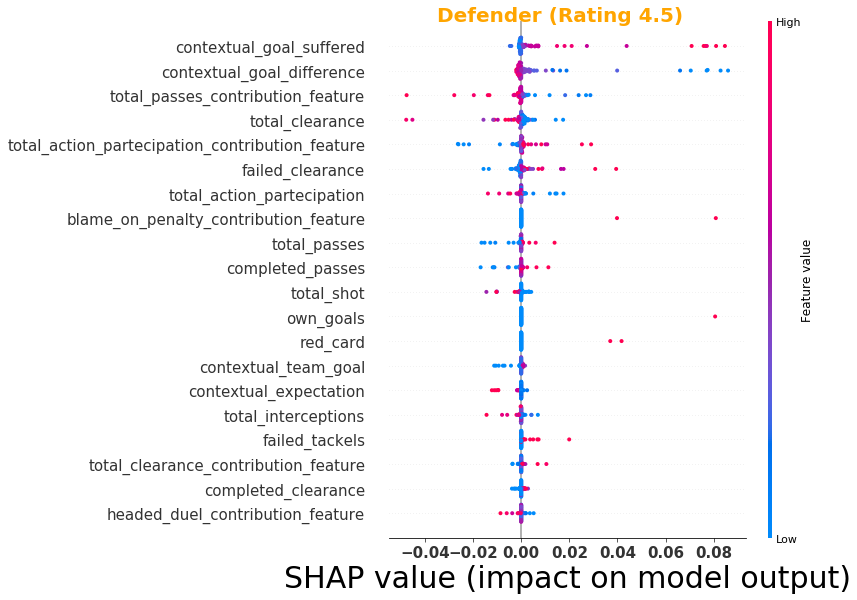

In [84]:
shap.summary_plot(shap_values_def[2], integral_def_test_set, show=False)
plt.text(-0.035,20,'Defender (Rating 4.5)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_45.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5 explanations

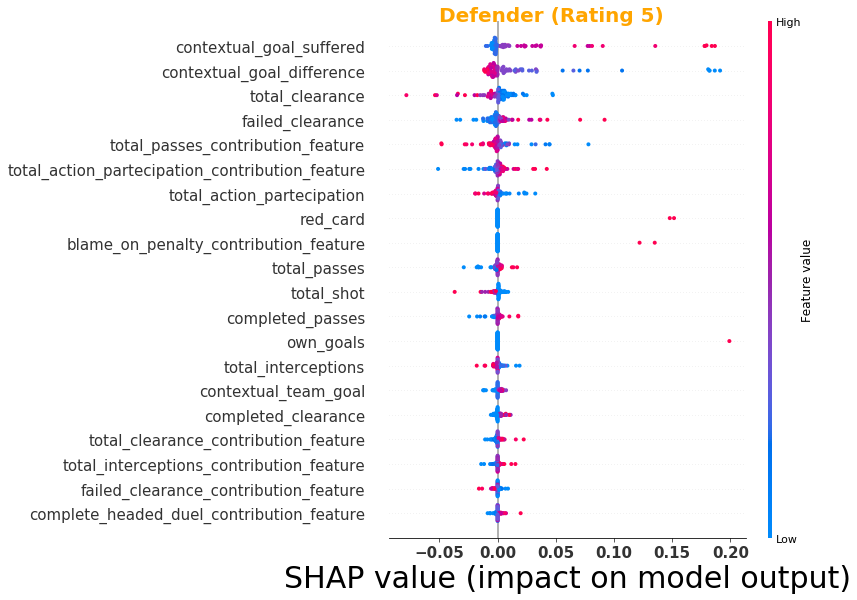

In [82]:
shap.summary_plot(shap_values_def[3], integral_def_test_set, show=False)
plt.text(-0.05,20,'Defender (Rating 5)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_5.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5.5 explanations

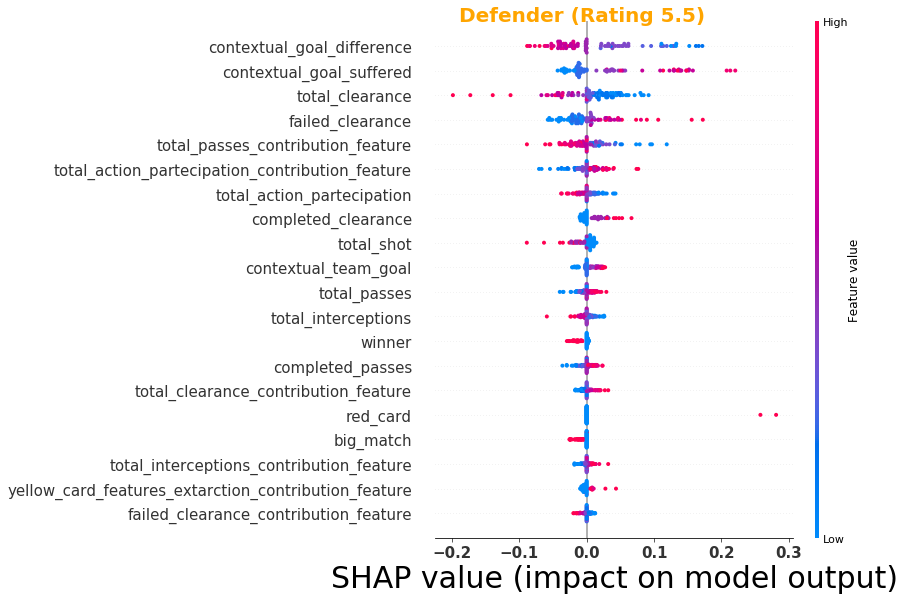

In [75]:
shap.summary_plot(shap_values_def[4], integral_def_test_set, show=False)
plt.text(-0.19,20,'Defender (Rating 5.5)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_55.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6 explanations

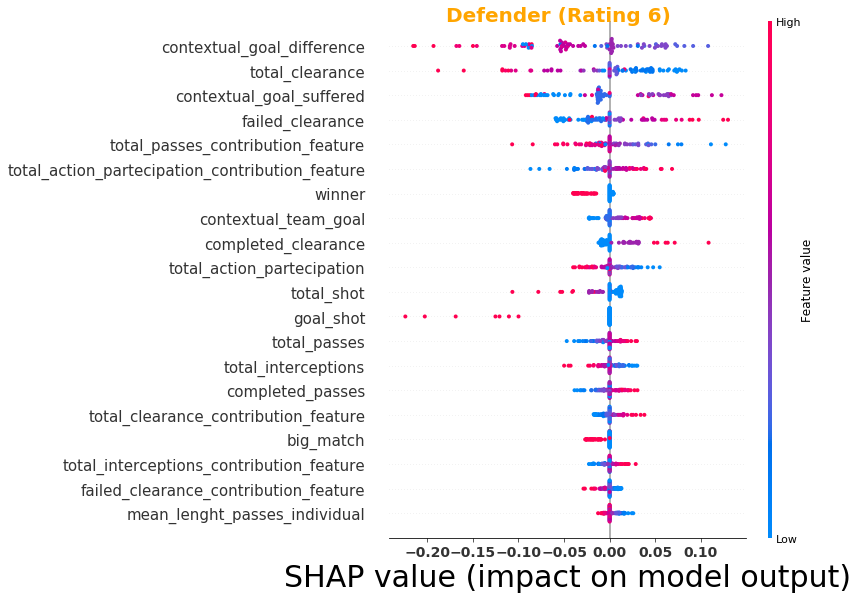

In [77]:
shap.summary_plot(shap_values_def[5], integral_def_test_set, show=False)
plt.text(-0.18,20,'Defender (Rating 6)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_6.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6.5 explanations

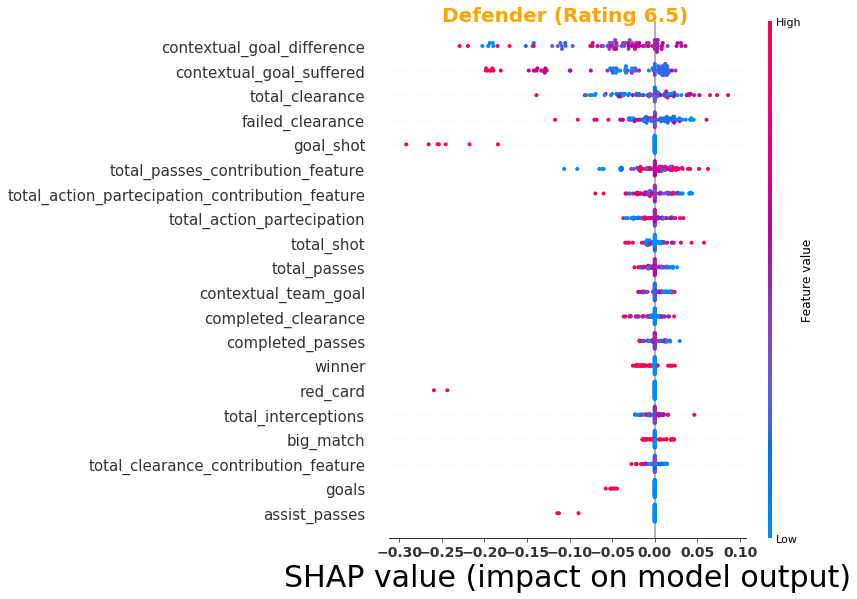

In [79]:
shap.summary_plot(shap_values_def[6], integral_def_test_set, show=False)
plt.text(-0.25,20,'Defender (Rating 6.5)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=14, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_65.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

7 explanations

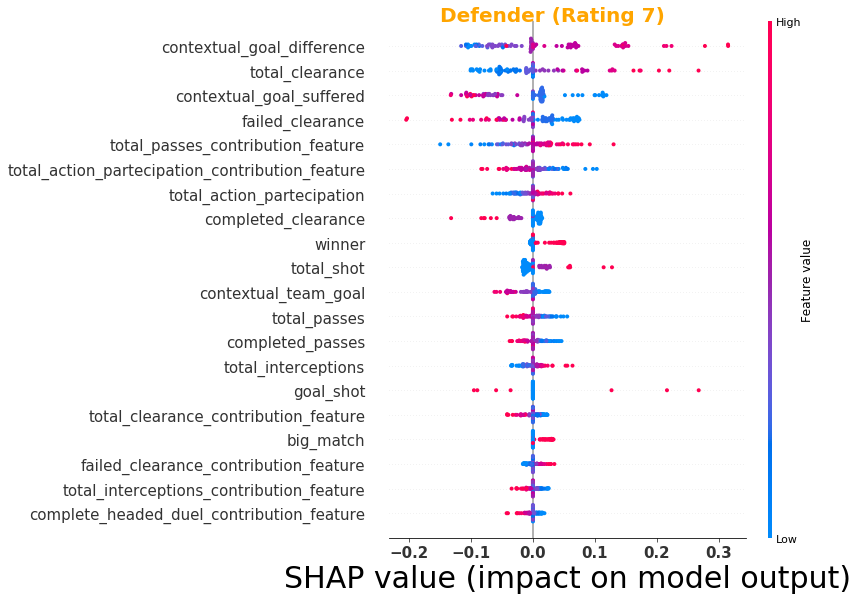

In [55]:
shap.summary_plot(shap_values_def[7], integral_def_test_set, show=False)
plt.text(-0.15,20,'Defender (Rating 7)', fontsize=20, fontweight='bold', color='orange')
plt.xticks(fontsize=15, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'def_glocal_explanation_7.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

### Goalkeeper Role
4.5 Explanations

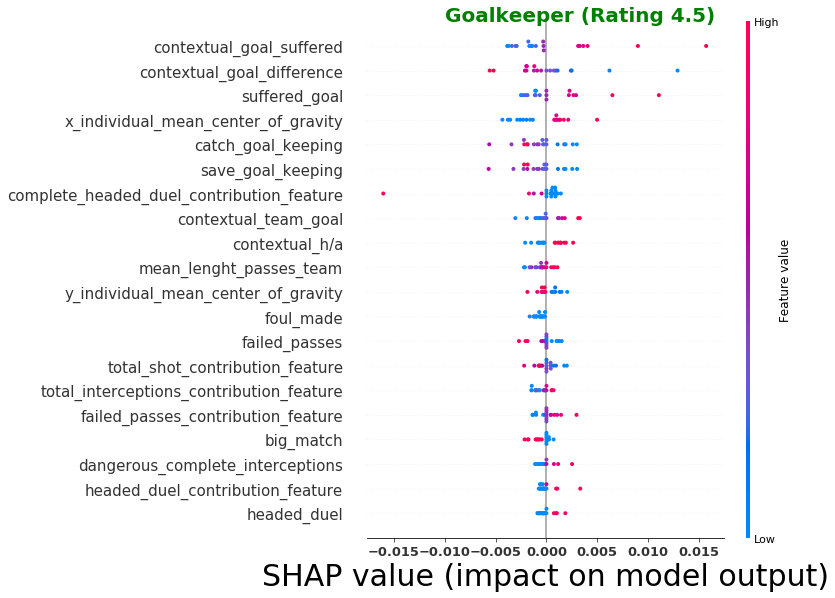

In [87]:
shap.summary_plot(shap_values_gk[2], integral_gk_test_set, show=False)
plt.text(-0.010,20,'Goalkeeper (Rating 4.5)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_45.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5 explanations

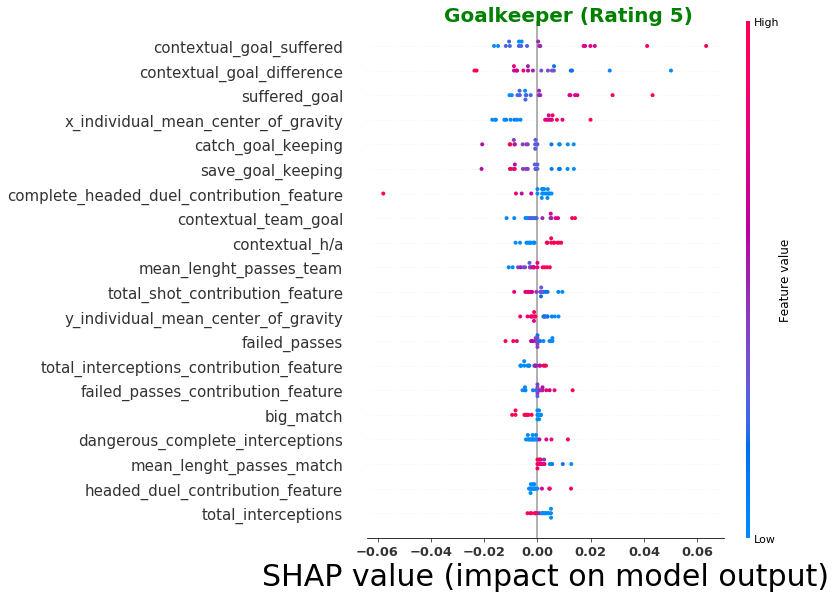

In [88]:
shap.summary_plot(shap_values_gk[3], integral_gk_test_set, show=False)
plt.text(-0.035,20,'Goalkeeper (Rating 5)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_5.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

5.5 explanations

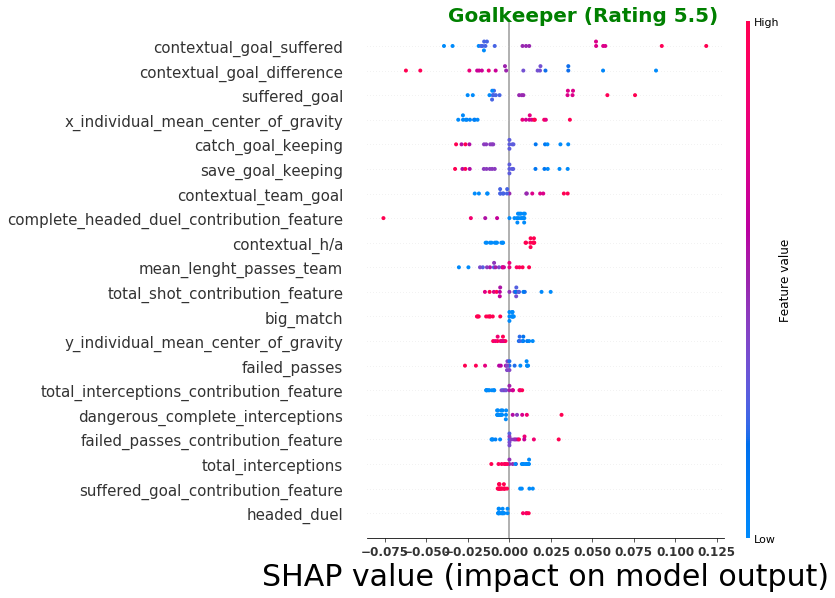

In [90]:
shap.summary_plot(shap_values_gk[4], integral_gk_test_set, show=False)
plt.text(-0.037,20,'Goalkeeper (Rating 5.5)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_55.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6 explanations

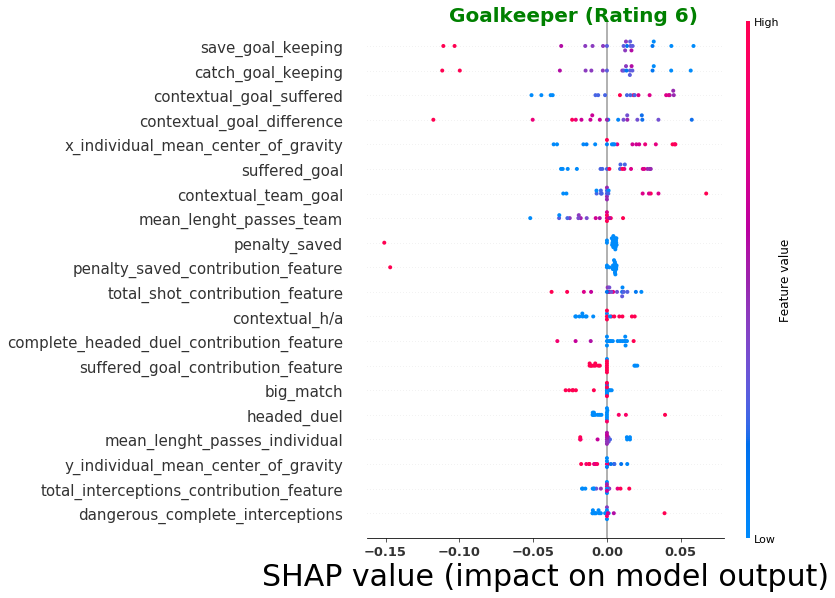

In [91]:
shap.summary_plot(shap_values_gk[5], integral_gk_test_set, show=False)
plt.text(-0.107,20,'Goalkeeper (Rating 6)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_6.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

6.5 explanations

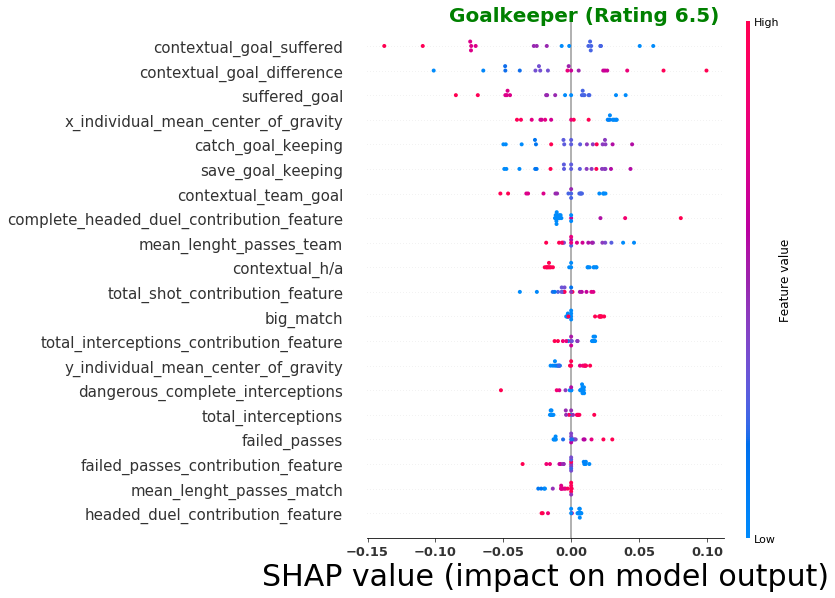

In [92]:
shap.summary_plot(shap_values_gk[6], integral_gk_test_set, show=False)
plt.text(-0.09,20,'Goalkeeper (Rating 6.5)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_65.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")

7 explanations

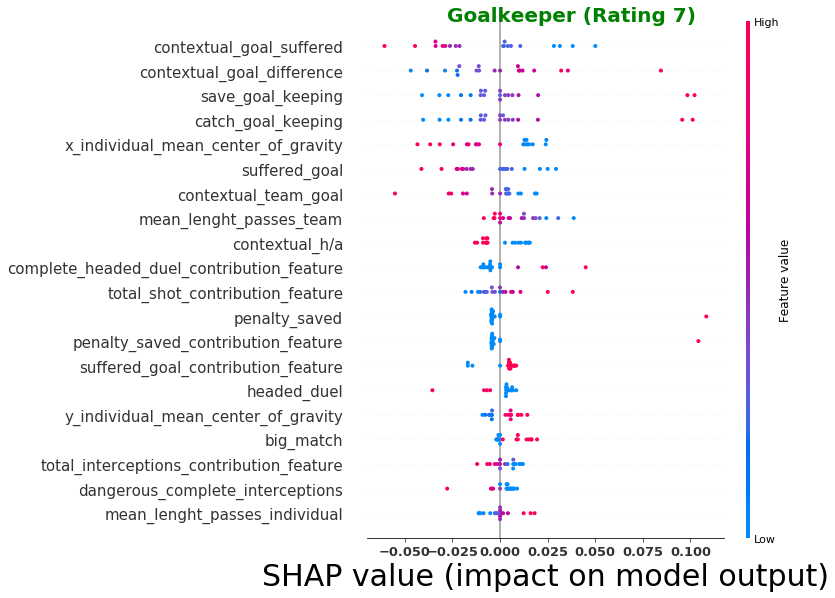

In [94]:
shap.summary_plot(shap_values_gk[7], integral_gk_test_set, show=False)
plt.text(-0.028,20,'Goalkeeper (Rating 7)', fontsize=20, fontweight='bold', color='green')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=15)
plt.xlabel('SHAP value (impact on model output)',fontsize=30)
name_figure = 'gk_glocal_explanation_7.pdf'
plt.savefig(os.path.join(IMG_DATAPATH, name_figure),dpi=300, bbox_inches = "tight")